Se encontraron 9 pares válidos:

Entrada: Cuerda1_3N1_in.wav  →  Salida: cuerda1_3N1.wav
Entrada: Cuerda1_3N2_in.wav  →  Salida: cuerda1_3N2.wav
Entrada: Cuerda1_3N3_in.wav  →  Salida: cuerda1_3N3.wav
Entrada: Cuerda4_3N2_in.wav  →  Salida: cuerda4_3N2.wav
Entrada: Cuerda4_3N3_in.wav  →  Salida: cuerda4_3N3.wav
Entrada: Cuerda5_3N1_in.wav  →  Salida: cuerda5_3N1.wav
Entrada: Cuerda5_3N2_in.wav  →  Salida: cuerda5_3N2.wav
Entrada: Cuerda5_3N3_in.wav  →  Salida: cuerda5_3N3.wav
Entrada: cuerda4_3N1_in.wav  →  Salida: cuerda4_3N1.wav

Procesando 9 pares usando 16 núcleos...


=== Cuerda1_3N1_in.wav vs cuerda1_3N1.wav ===
Duración: 15.70 s | Frecuencia de muestreo: 44100 Hz


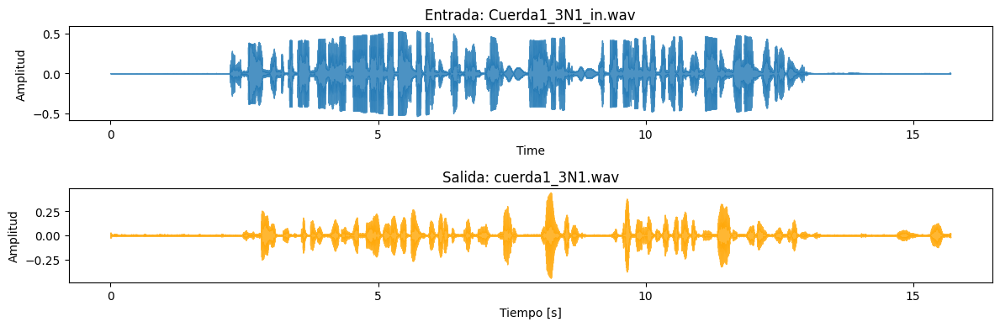

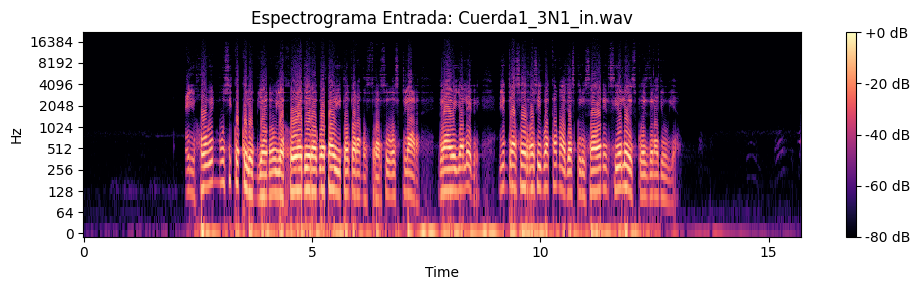

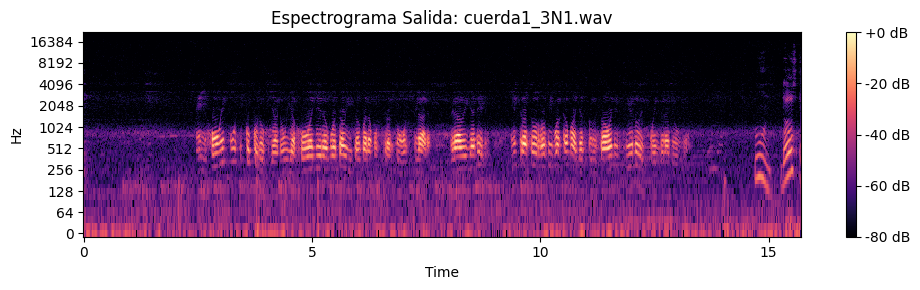

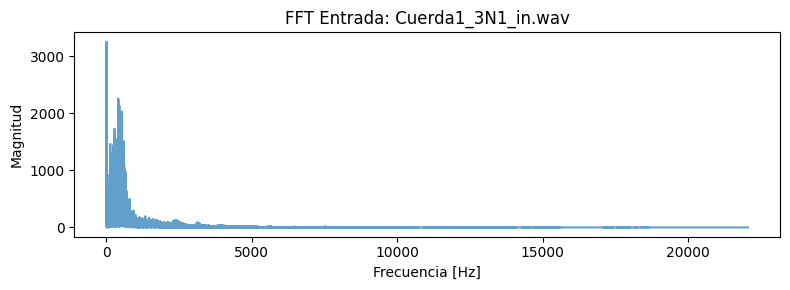

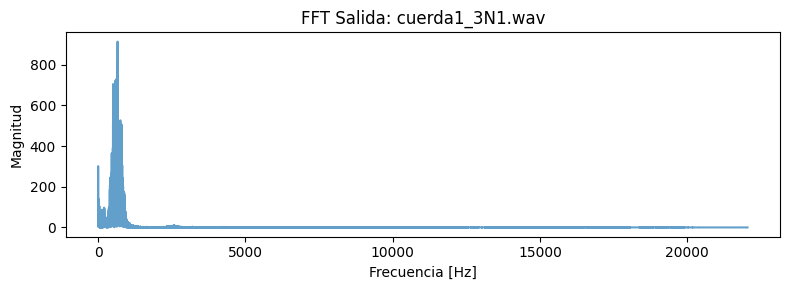


=== Cuerda1_3N2_in.wav vs cuerda1_3N2.wav ===
Duración: 16.81 s | Frecuencia de muestreo: 44100 Hz


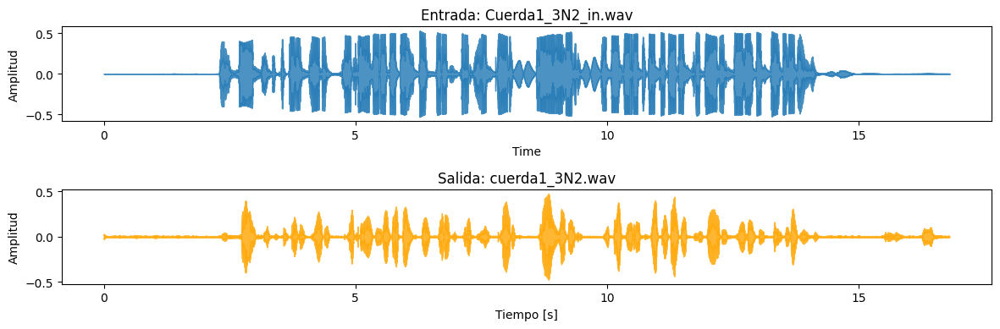

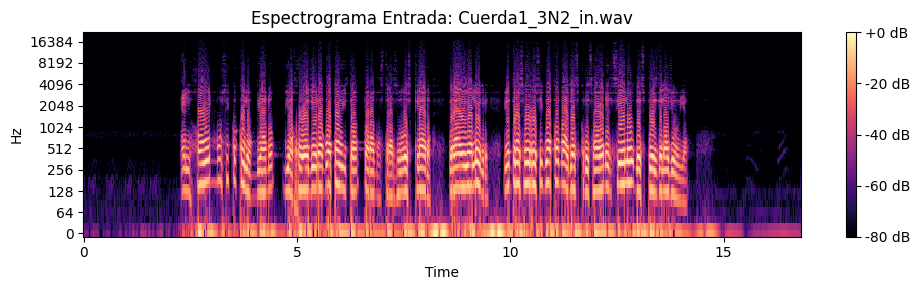

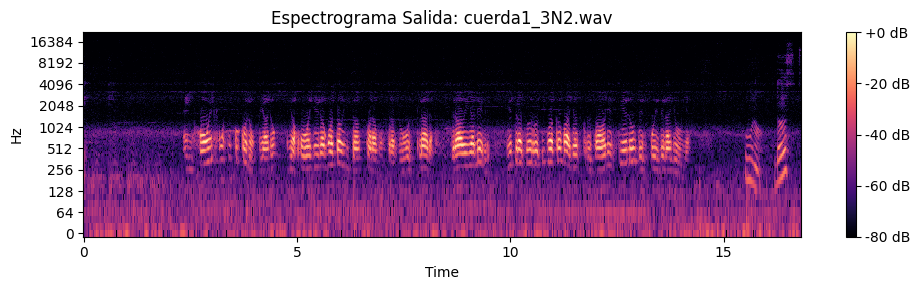

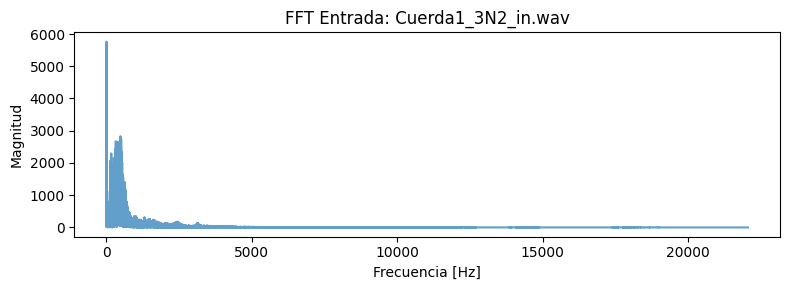

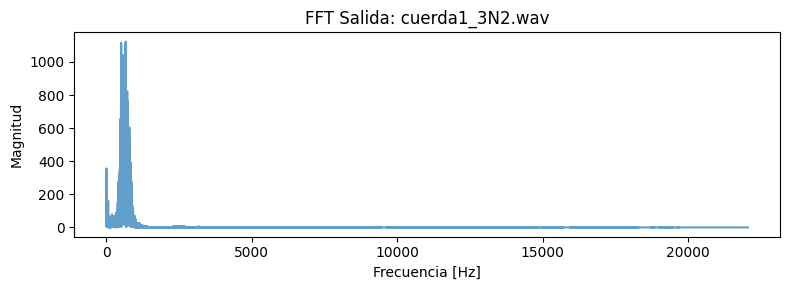


=== Cuerda1_3N3_in.wav vs cuerda1_3N3.wav ===
Duración: 15.53 s | Frecuencia de muestreo: 44100 Hz


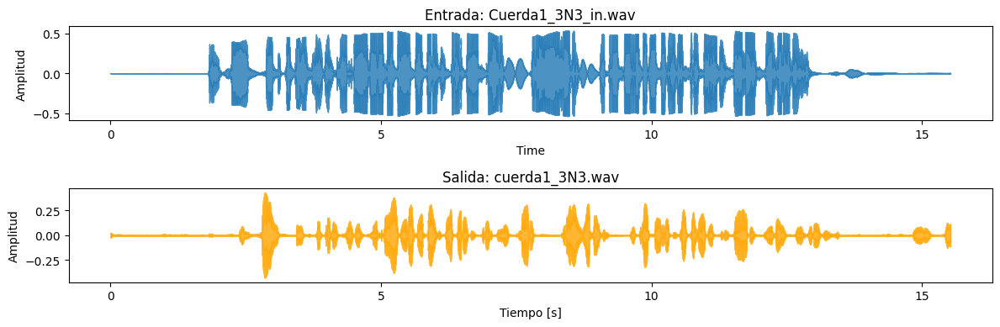

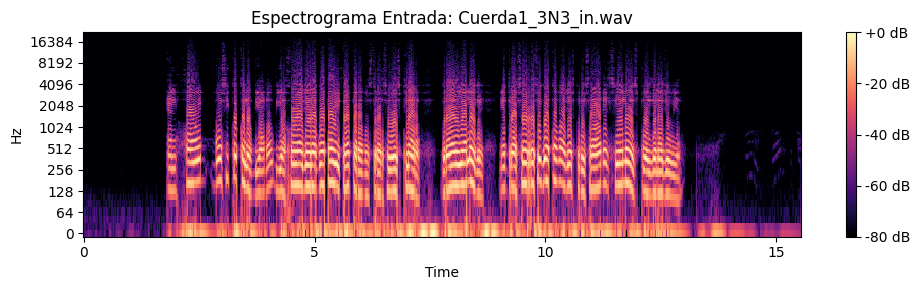

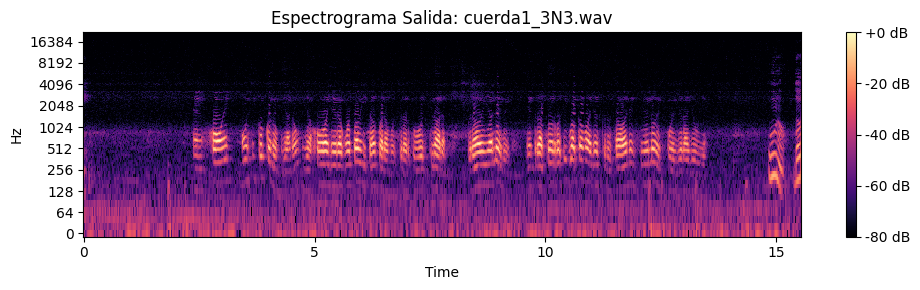

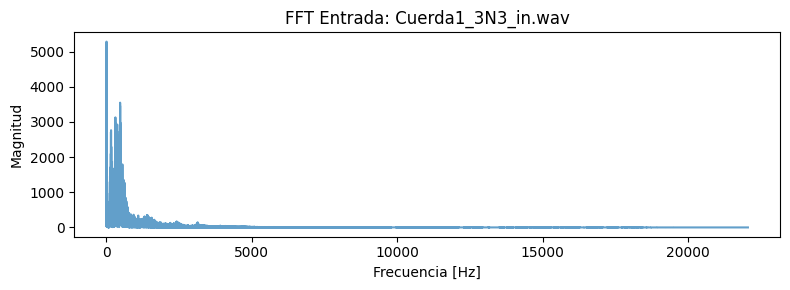

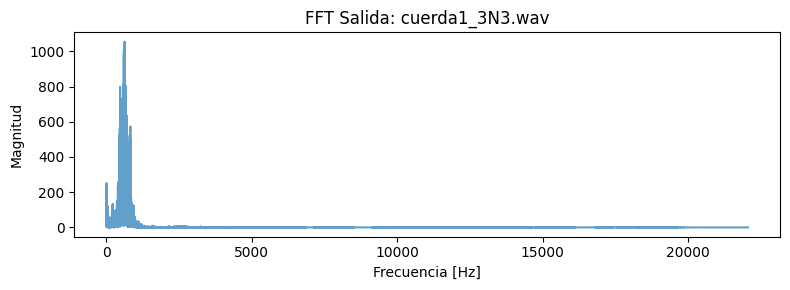


=== Cuerda4_3N2_in.wav vs cuerda4_3N2.wav ===
Duración: 19.33 s | Frecuencia de muestreo: 44100 Hz


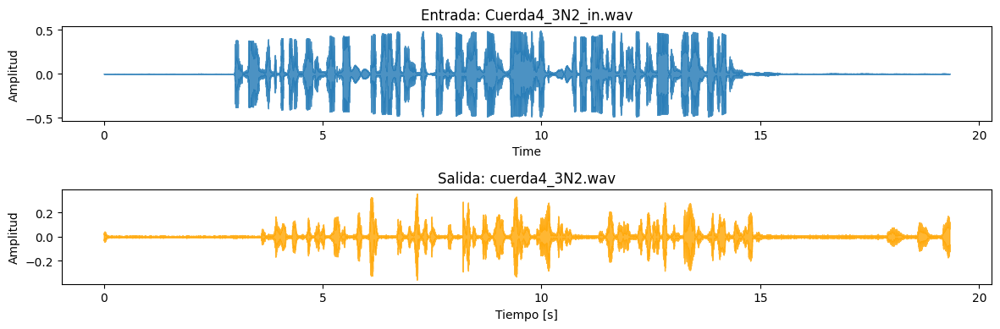

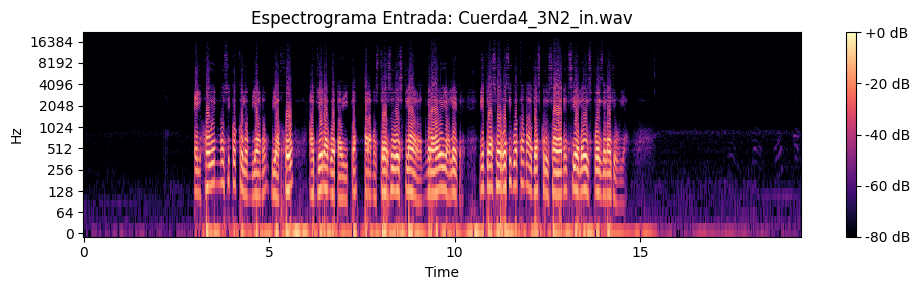

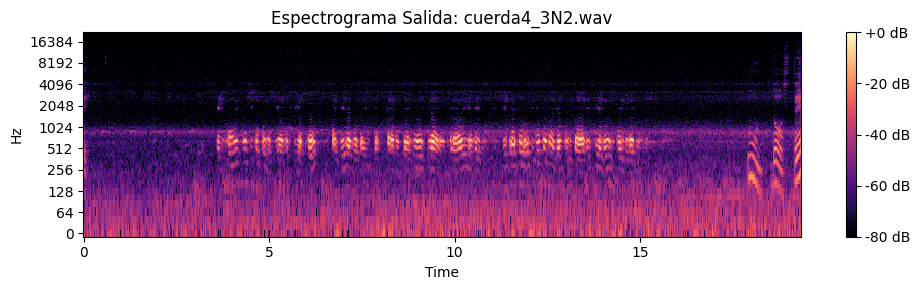

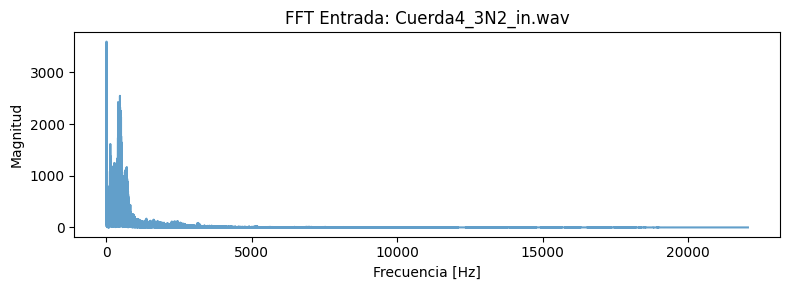

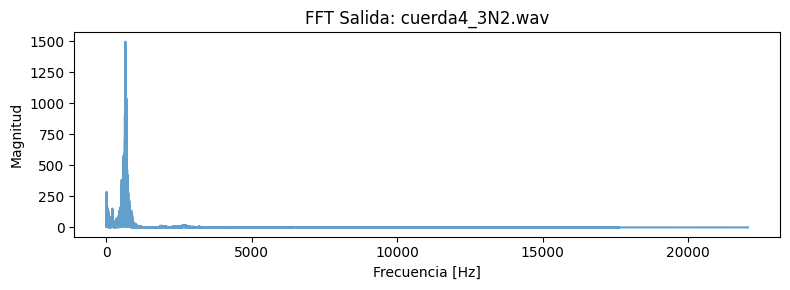


=== Cuerda4_3N3_in.wav vs cuerda4_3N3.wav ===
Duración: 17.96 s | Frecuencia de muestreo: 44100 Hz


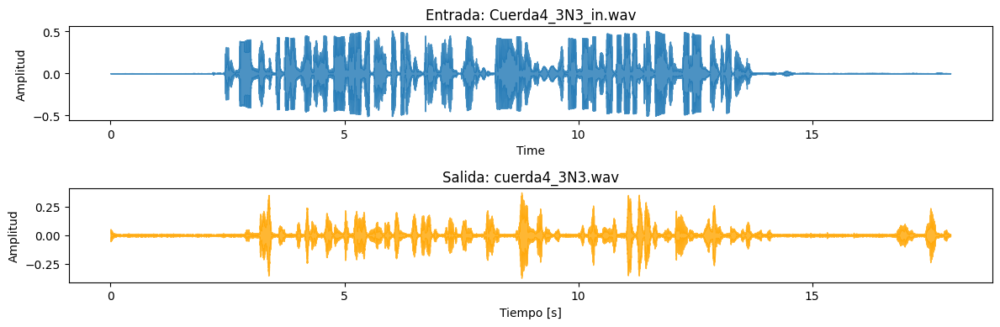

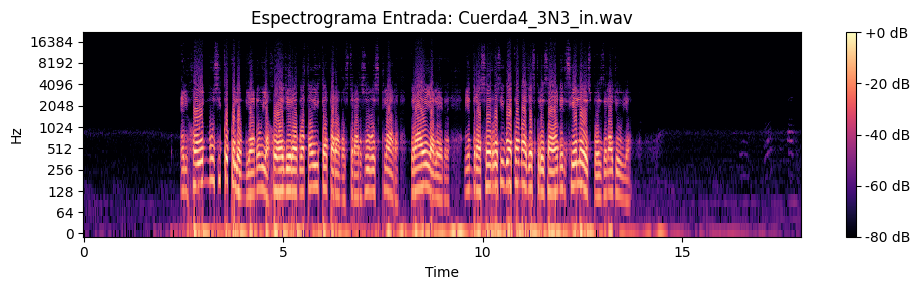

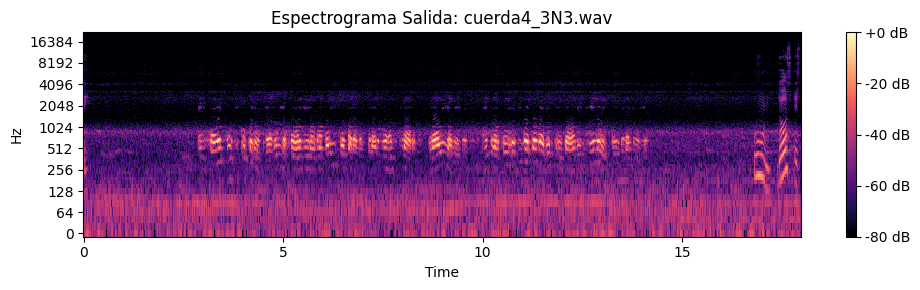

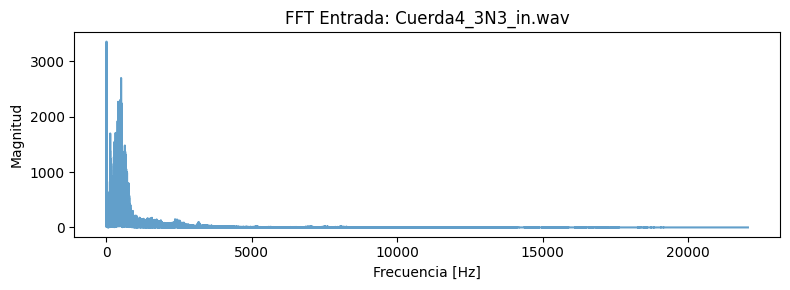

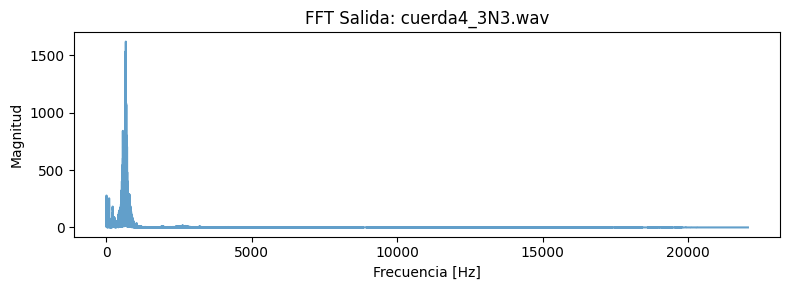


=== Cuerda5_3N1_in.wav vs cuerda5_3N1.wav ===
Duración: 17.96 s | Frecuencia de muestreo: 44100 Hz


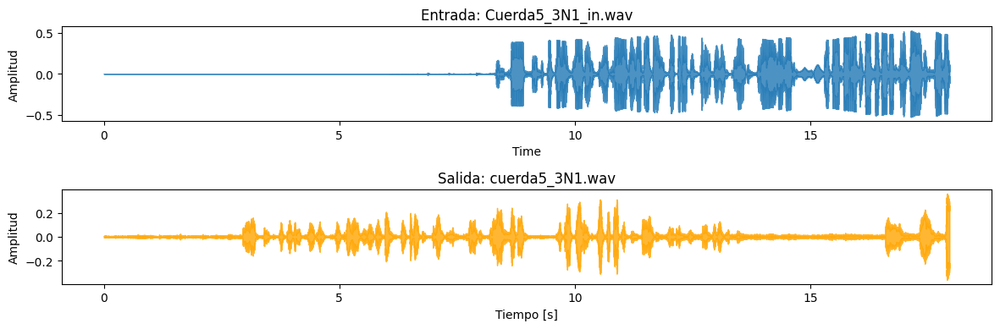

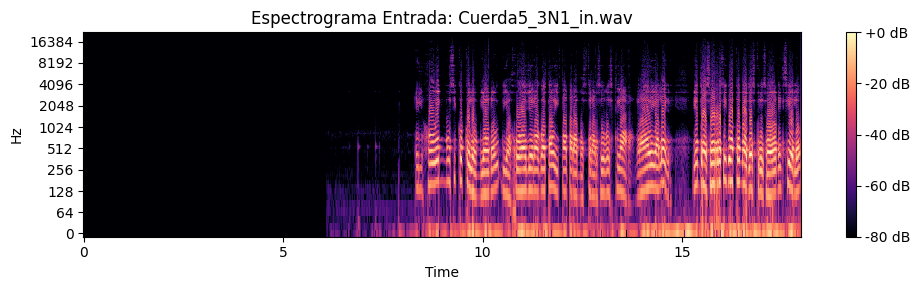

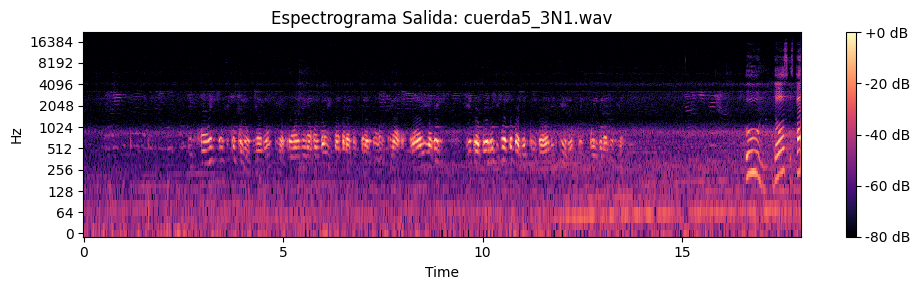

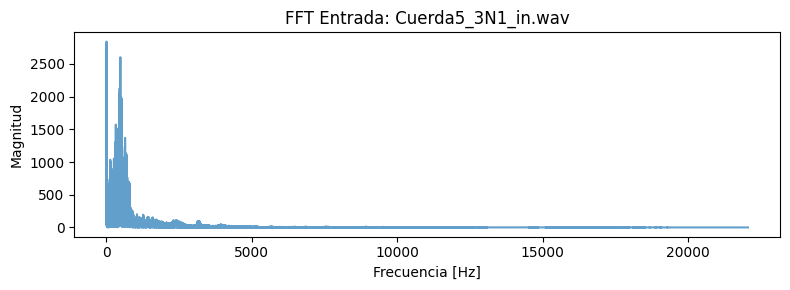

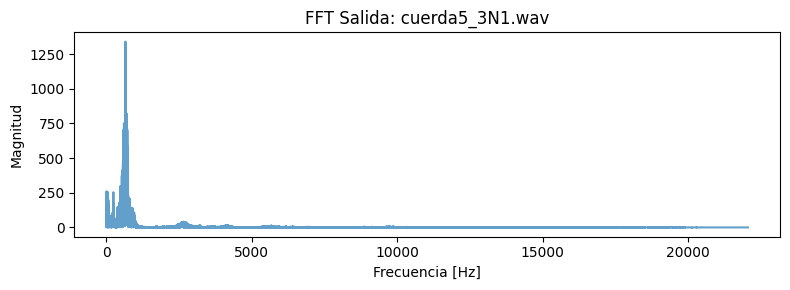


=== Cuerda5_3N2_in.wav vs cuerda5_3N2.wav ===
Duración: 15.83 s | Frecuencia de muestreo: 44100 Hz


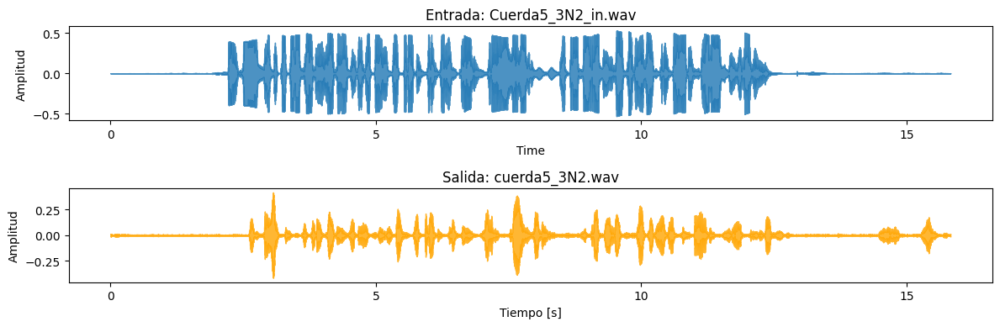

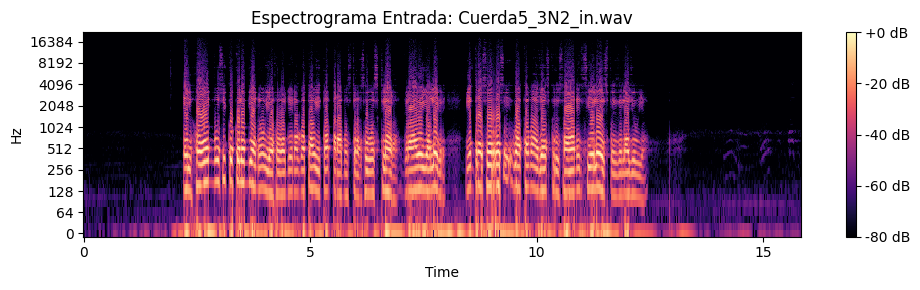

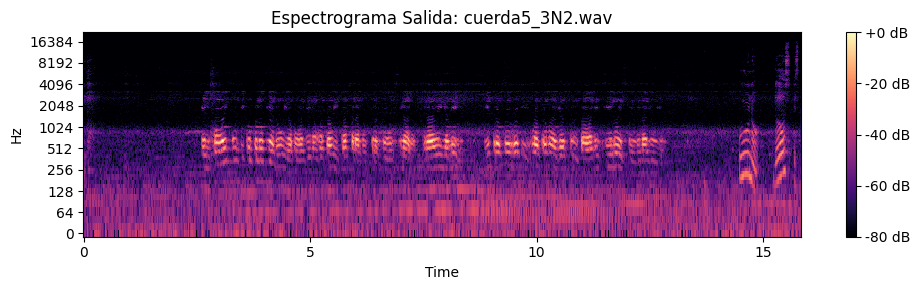

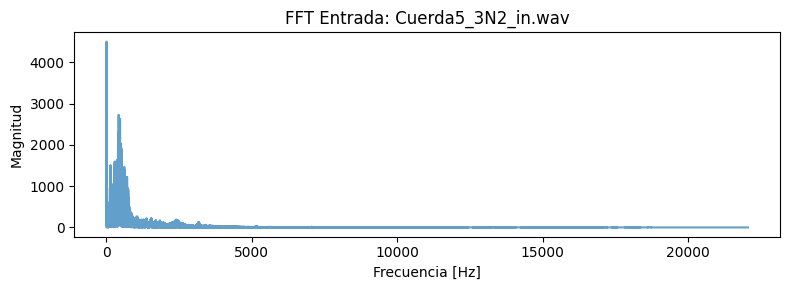

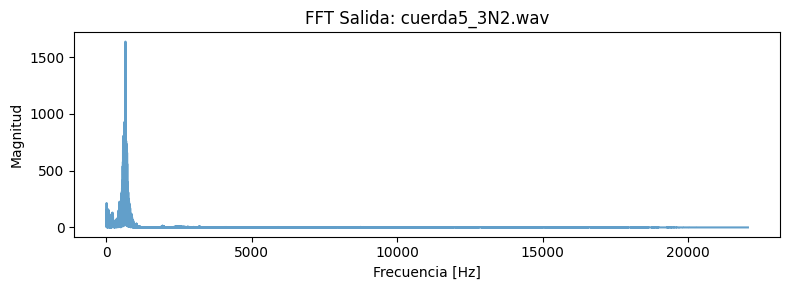


=== Cuerda5_3N3_in.wav vs cuerda5_3N3.wav ===
Duración: 15.96 s | Frecuencia de muestreo: 44100 Hz


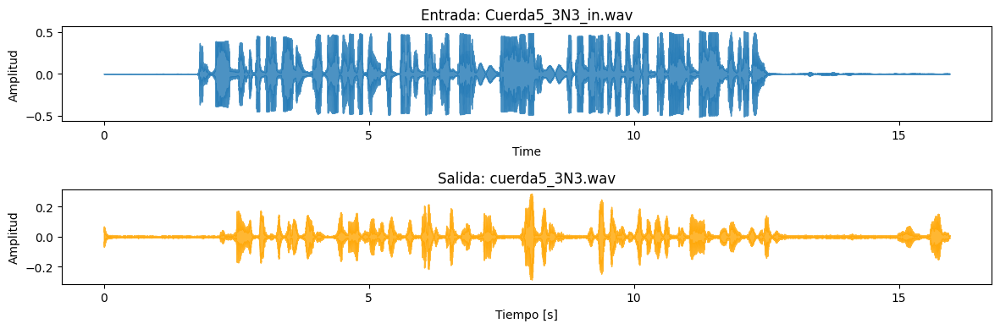

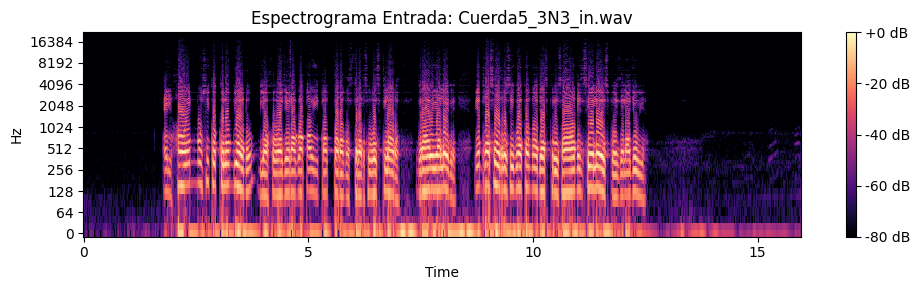

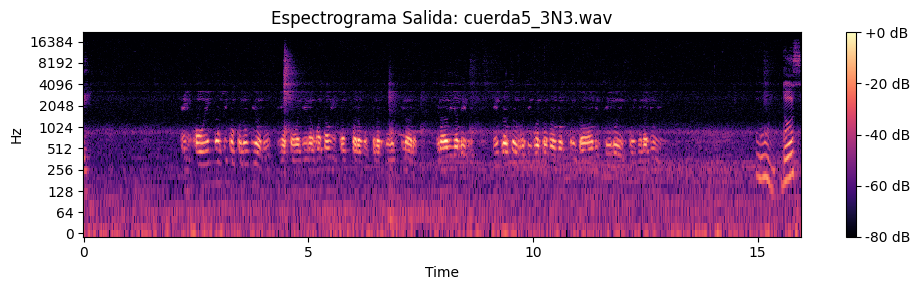

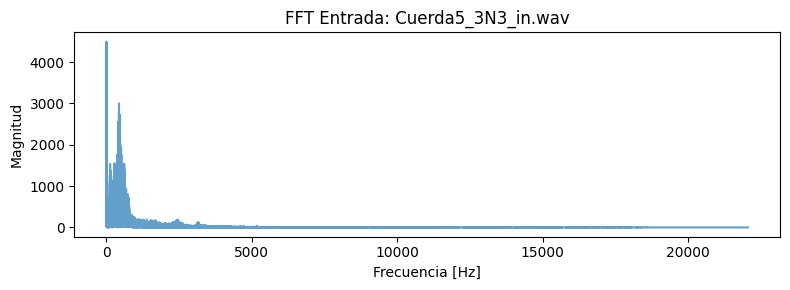

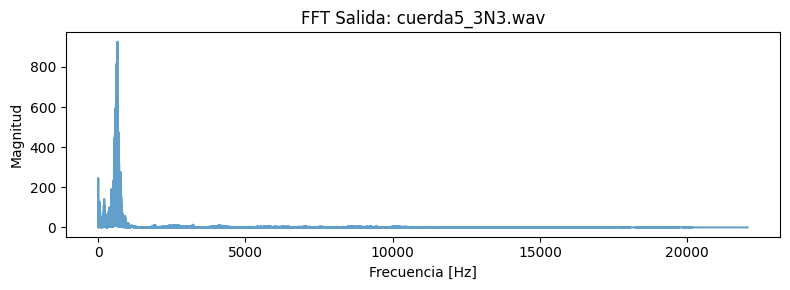


=== cuerda4_3N1_in.wav vs cuerda4_3N1.wav ===
Duración: 17.58 s | Frecuencia de muestreo: 44100 Hz


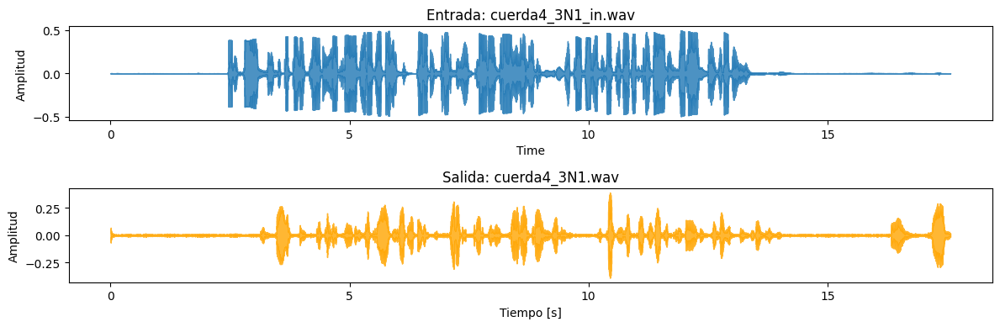

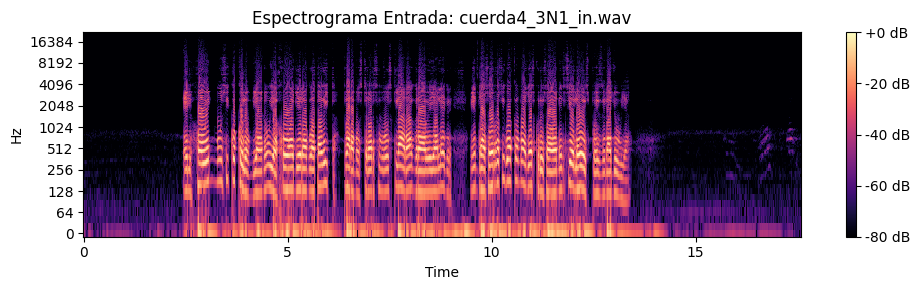

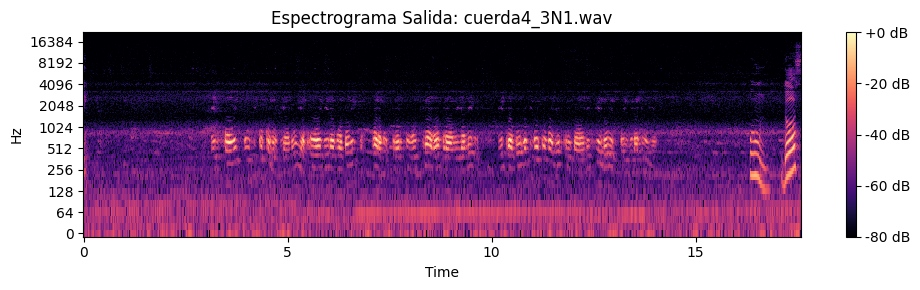

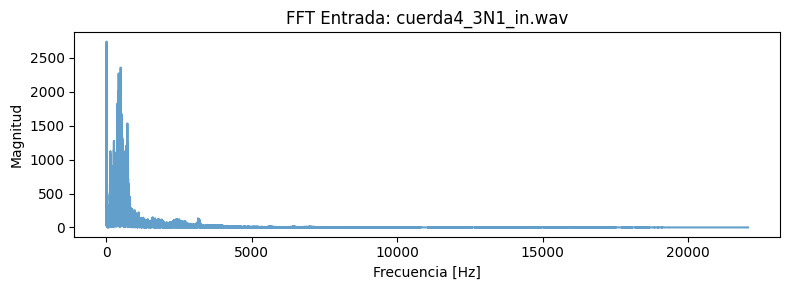

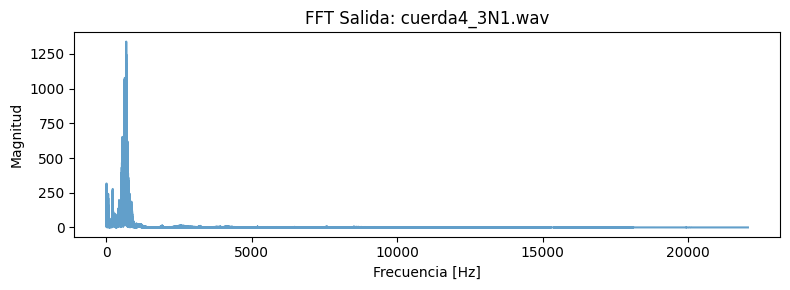


=== Cuerda5_3N3_in.wav vs cuerda5_3N3.wav ===
Duración: 15.96 s | Frecuencia de muestreo: 44100 Hz
Figure(1200x400)
Figure(1000x300)
Figure(1000x300)
Figure(800x300)
Figure(800x300)

=== cuerda4_3N1_in.wav vs cuerda4_3N1.wav ===
Duración: 17.58 s | Frecuencia de muestreo: 44100 Hz
Figure(1200x400)
Figure(1000x300)
Figure(1000x300)
Figure(800x300)
Figure(800x300)

=== Cuerda5_3N2_in.wav vs cuerda5_3N2.wav ===
Duración: 15.83 s | Frecuencia de muestreo: 44100 Hz
Figure(1200x400)
Figure(1000x300)
Figure(1000x300)
Figure(800x300)
Figure(800x300)

=== Cuerda5_3N3_in.wav vs cuerda5_3N3.wav ===
Duración: 15.96 s | Frecuencia de muestreo: 44100 Hz
Figure(1200x400)
Figure(1000x300)
Figure(1000x300)
Figure(800x300)
Figure(800x300)

=== Cuerda1_3N3_in.wav vs cuerda1_3N3.wav ===
Duración: 15.53 s | Frecuencia de muestreo: 44100 Hz
Figure(1200x400)
Figure(1000x300)
Figure(1000x300)
Figure(800x300)
Figure(800x300)

=== Cuerda4_3N3_in.wav vs cuerda4_3N3.wav ===
Duración: 17.96 s | Frecuencia de mues

In [6]:
# ============================================================
# 1. CARGA AUTOMÁTICA Y VISUALIZACIÓN DE PARES DE ARCHIVOS WAV
# ============================================================

import os
import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from joblib import Parallel, delayed
import multiprocessing

# ------------------------------------------------------------
# 1.1 Directorio donde están los archivos .wav
# ------------------------------------------------------------
directorio = "."  # directorio actual

# ------------------------------------------------------------
# 1.2 Buscar pares entrada-salida (sin distinguir mayúsculas)
# ------------------------------------------------------------
archivos = sorted([f for f in os.listdir(directorio) if f.lower().endswith(".wav")])

# Crear diccionario con nombres en minúsculas
archivos_lower = {f.lower(): f for f in archivos}

pares = []
for f in archivos:
    f_lower = f.lower()
    if "_in" in f_lower:
        base_lower = f_lower.replace("_in", "")
        if base_lower in archivos_lower:
            pares.append((f, archivos_lower[base_lower]))

print(f"Se encontraron {len(pares)} pares válidos:\n")
for p in pares:
    print(f"Entrada: {p[0]}  →  Salida: {p[1]}")

# ============================================================
# 2. FUNCIONES DE VISUALIZACIÓN
# ============================================================

def mostrar_espectrograma(y, sr, titulo):
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    plt.figure(figsize=(10,3))
    librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.colorbar(format='%+2.0f dB')
    plt.title(titulo)
    plt.tight_layout()
    plt.show()

def plot_fft(y, sr, titulo):
    N = len(y)
    Y = np.fft.rfft(y)
    f = np.fft.rfftfreq(N, 1/sr)
    plt.figure(figsize=(8,3))
    plt.plot(f, np.abs(Y), alpha=0.7)
    plt.title(titulo)
    plt.xlabel("Frecuencia [Hz]")
    plt.ylabel("Magnitud")
    plt.tight_layout()
    plt.show()

# ============================================================
# 3. FUNCIÓN PRINCIPAL PARA PROCESAR UN PAR
# ============================================================

def procesar_par(entrada, salida, mostrar=True):
    path_in = os.path.join(directorio, entrada)
    path_out = os.path.join(directorio, salida)
    
    y_in, sr_in = librosa.load(path_in, sr=None)
    y_out, sr_out = librosa.load(path_out, sr=None)
    
    min_len = min(len(y_in), len(y_out))
    y_in, y_out = y_in[:min_len], y_out[:min_len]
    
    print(f"\n=== {entrada} vs {salida} ===")
    print(f"Duración: {len(y_in)/sr_in:.2f} s | Frecuencia de muestreo: {sr_in} Hz")
    
    if mostrar:
        # --- Señales en el tiempo ---
        plt.figure(figsize=(12,4))
        plt.subplot(2,1,1)
        librosa.display.waveshow(y_in, sr=sr_in, alpha=0.8)
        plt.title(f"Entrada: {entrada}")
        plt.ylabel("Amplitud")

        plt.subplot(2,1,2)
        librosa.display.waveshow(y_out, sr=sr_out, color='orange', alpha=0.8)
        plt.title(f"Salida: {salida}")
        plt.xlabel("Tiempo [s]")
        plt.ylabel("Amplitud")
        plt.tight_layout()
        plt.show()

        # --- Espectrogramas ---
        mostrar_espectrograma(y_in, sr_in, f"Espectrograma Entrada: {entrada}")
        mostrar_espectrograma(y_out, sr_out, f"Espectrograma Salida: {salida}")

        # --- FFT ---
        plot_fft(y_in, sr_in, f"FFT Entrada: {entrada}")
        plot_fft(y_out, sr_out, f"FFT Salida: {salida}")

    # Devuelve datos útiles para análisis posterior
    return {
        "entrada": entrada,
        "salida": salida,
        "sr": sr_in,
        "duracion": len(y_in) / sr_in,
        "energia_in": np.sum(y_in**2),
        "energia_out": np.sum(y_out**2)
    }

# ============================================================
# 4. EJECUCIÓN CONTROLADA
# ============================================================

num_cores = multiprocessing.cpu_count()
print(f"\nProcesando {len(pares)} pares usando {num_cores} núcleos...\n")

# === OPCIÓN A: Solo análisis numérico (paralelo, sin mostrar gráficos)
# resultados = Parallel(n_jobs=num_cores)(
#     delayed(procesar_par)(entrada, salida, mostrar=False) for entrada, salida in pares
# )

# === OPCIÓN B: Visualización interactiva (secuencial, con gráficos)
resultados = [procesar_par(entrada, salida, mostrar=True) for entrada, salida in pares]


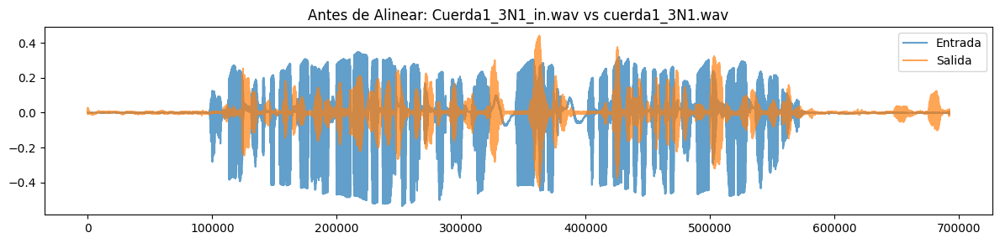

Cuerda1_3N1_in.wav vs cuerda1_3N1.wav: lag = 10660 muestras (241.72 ms)


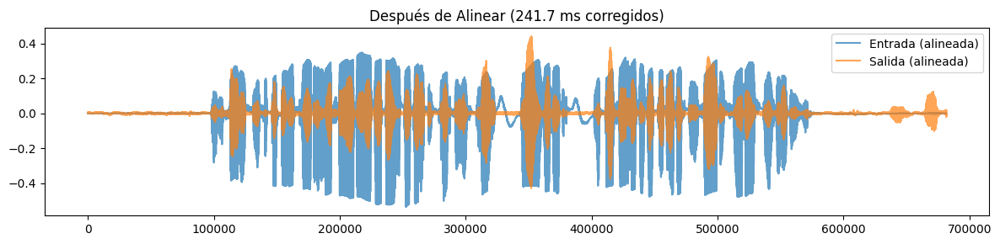

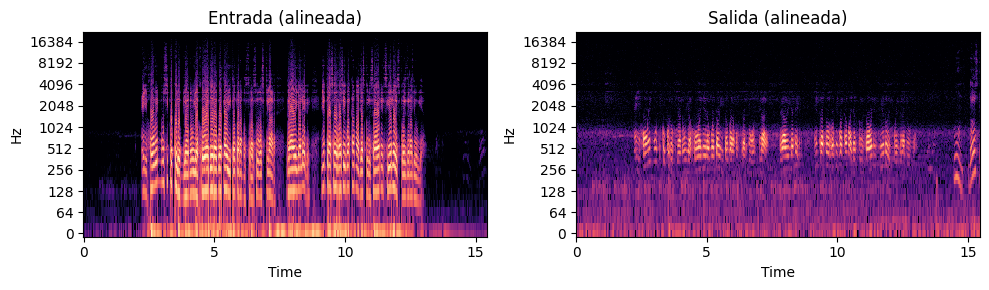

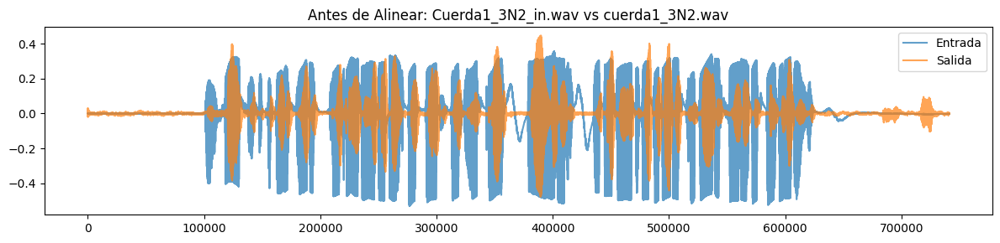

Cuerda1_3N2_in.wav vs cuerda1_3N2.wav: lag = 2183 muestras (49.50 ms)


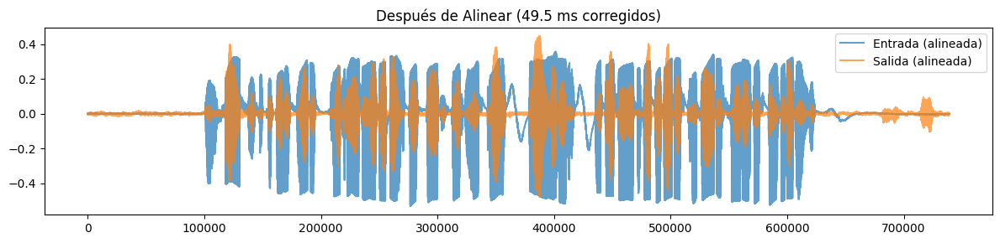

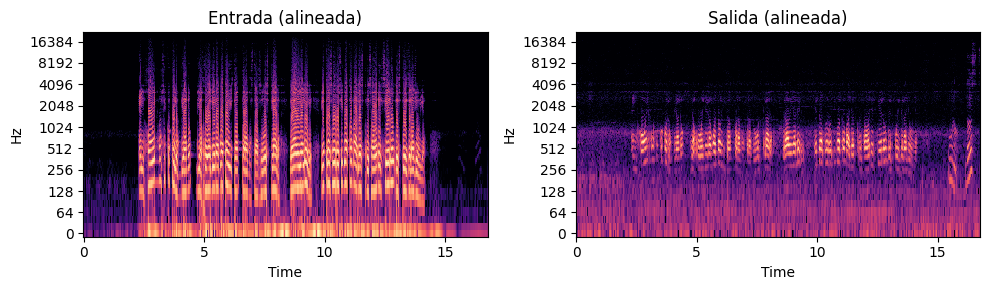

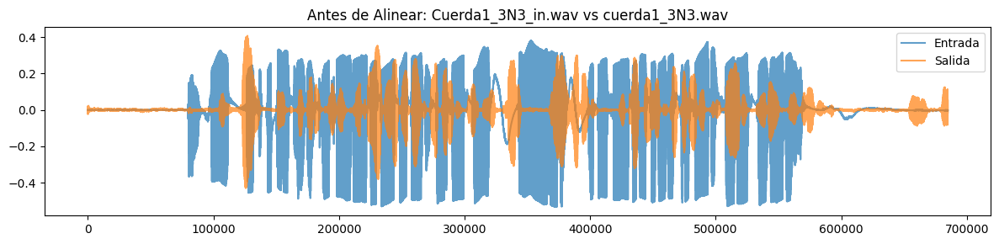

Cuerda1_3N3_in.wav vs cuerda1_3N3.wav: lag = 24744 muestras (561.09 ms)


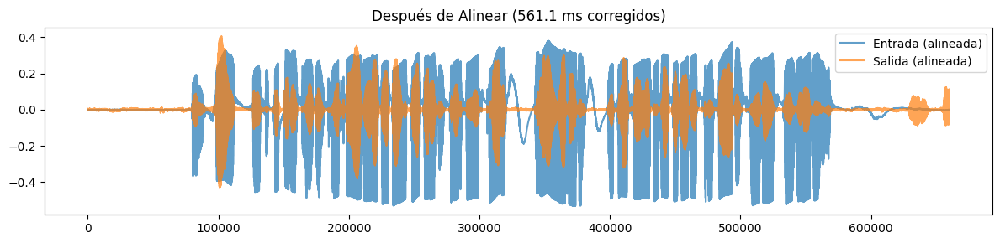

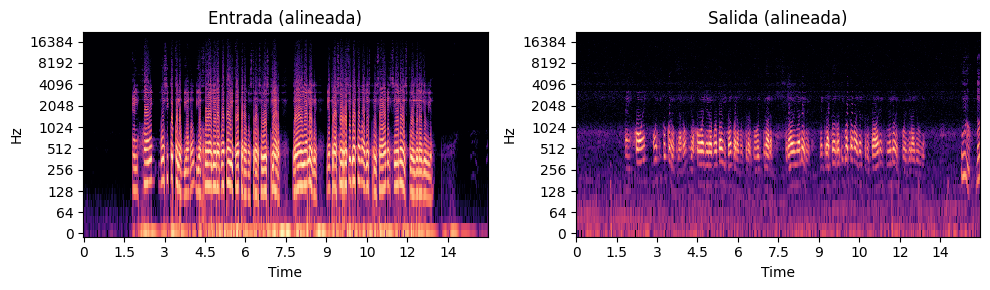

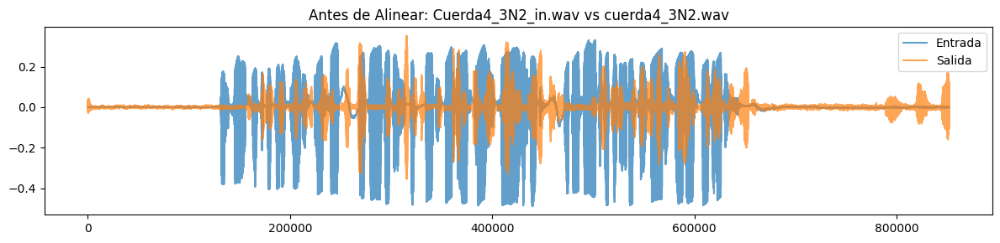

Cuerda4_3N2_in.wav vs cuerda4_3N2.wav: lag = 26754 muestras (606.67 ms)


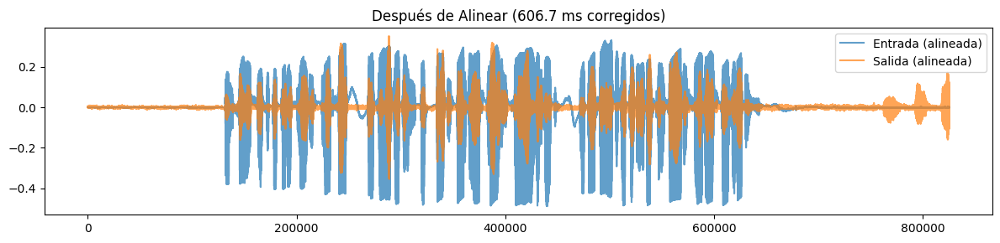

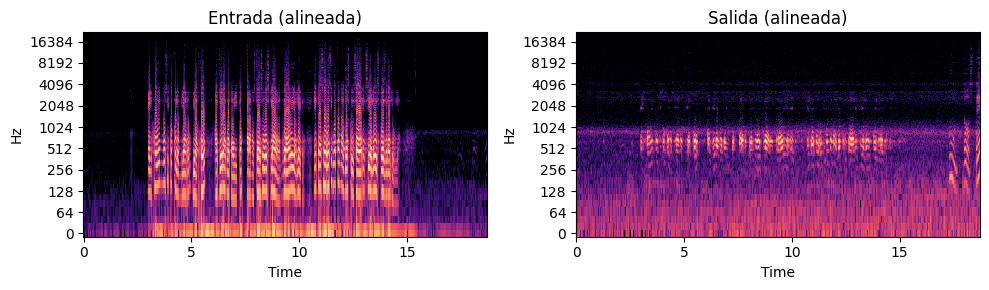

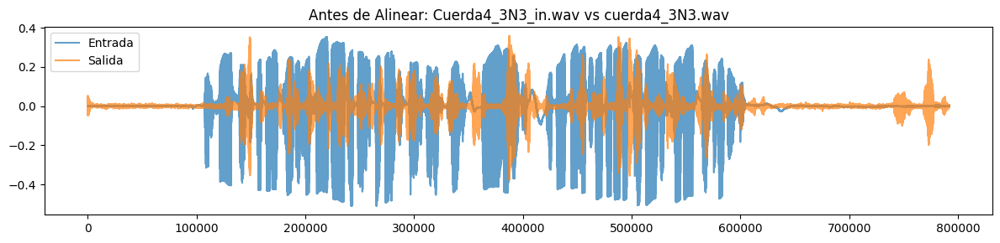

Cuerda4_3N3_in.wav vs cuerda4_3N3.wav: lag = 19183 muestras (434.99 ms)


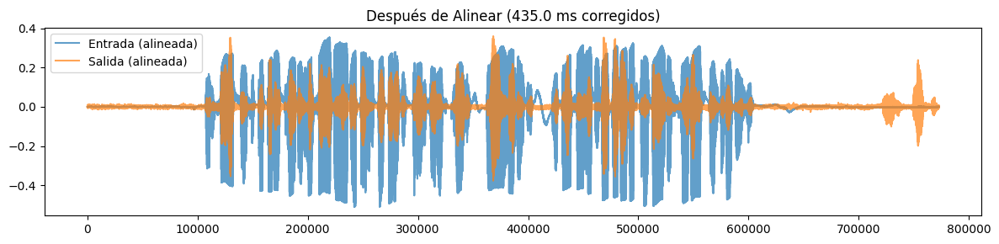

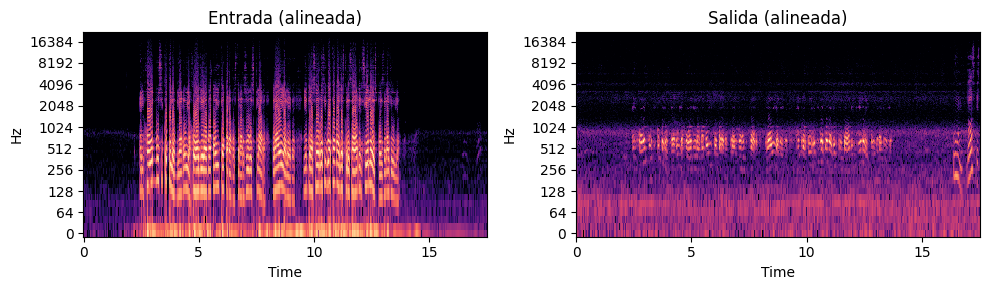

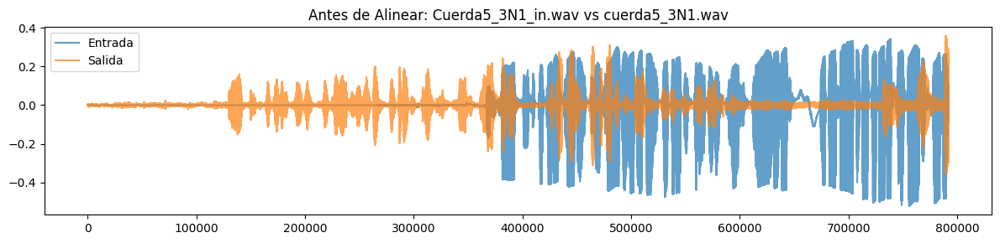

Cuerda5_3N1_in.wav vs cuerda5_3N1.wav: lag = -251228 muestras (-5696.78 ms)


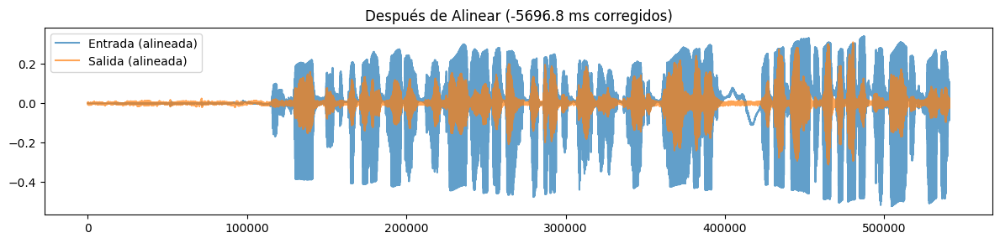

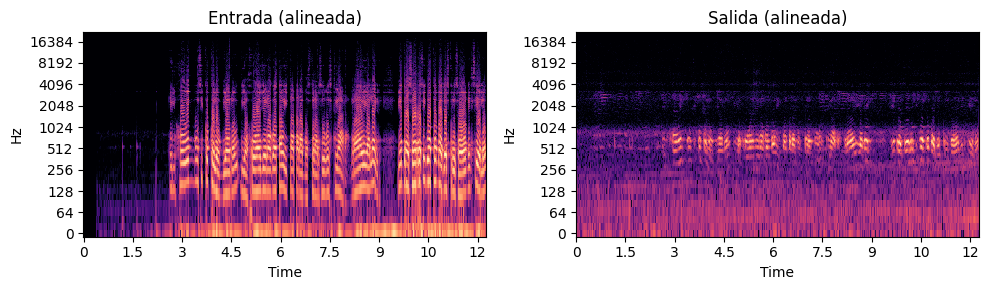

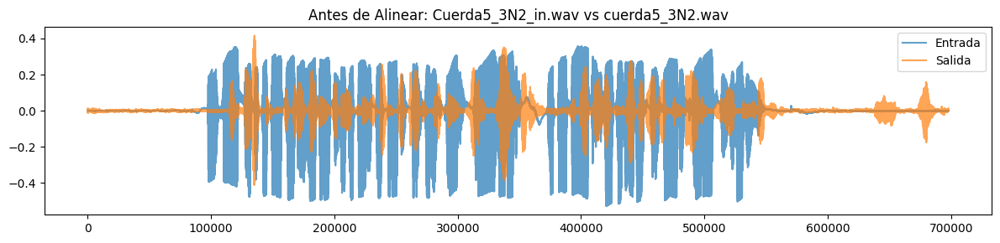

Cuerda5_3N2_in.wav vs cuerda5_3N2.wav: lag = 17452 muestras (395.74 ms)


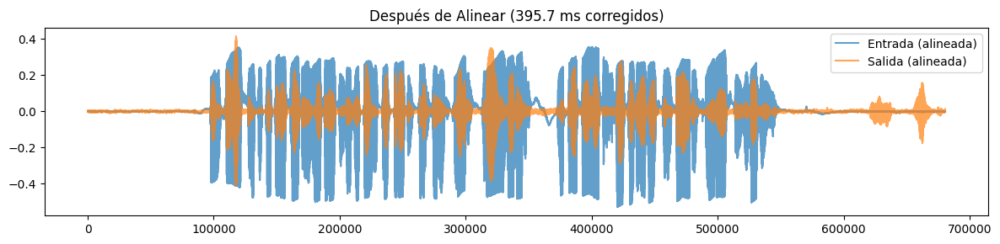

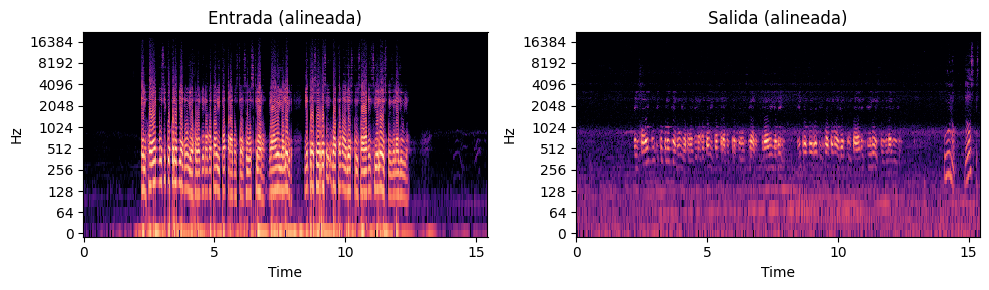

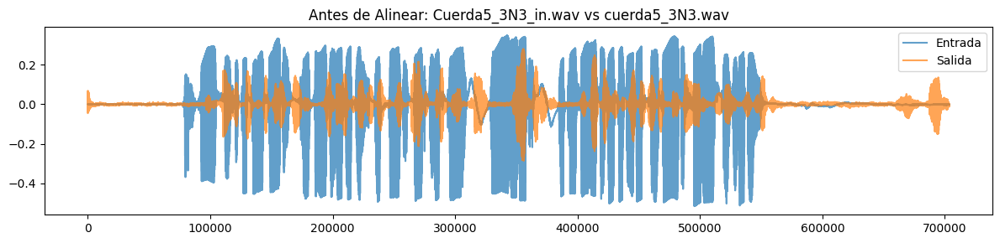

Cuerda5_3N3_in.wav vs cuerda5_3N3.wav: lag = 17430 muestras (395.24 ms)


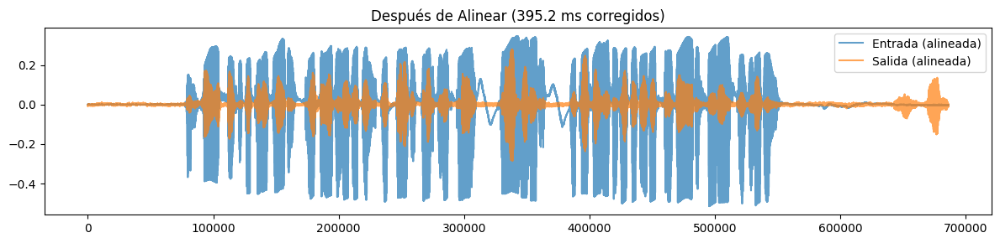

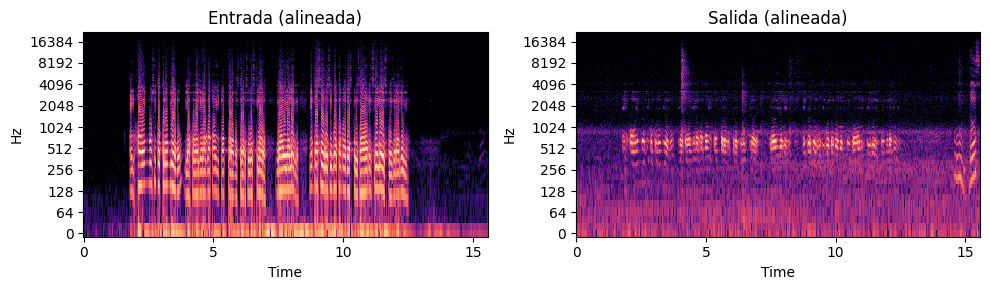

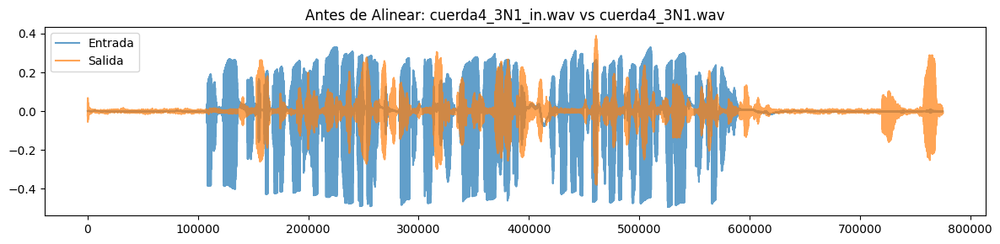

cuerda4_3N1_in.wav vs cuerda4_3N1.wav: lag = 29625 muestras (671.77 ms)


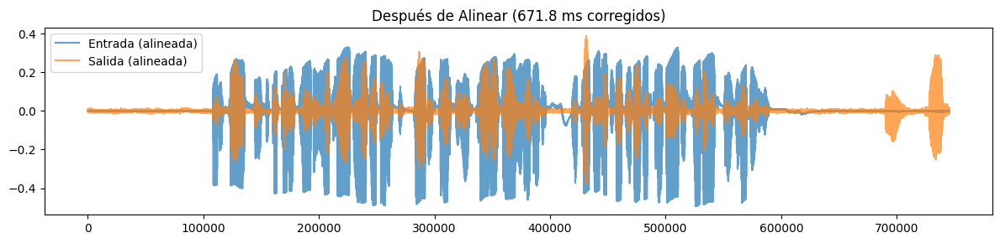

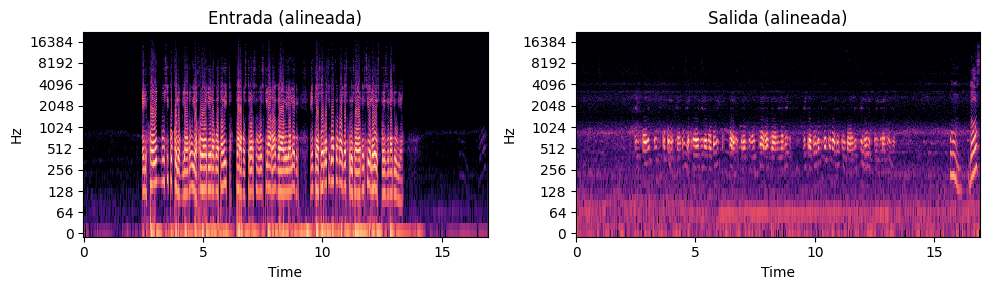

In [8]:
#Sincronizacíon.
# ============================================================
# 5. ALINEACIÓN AUTOMÁTICA POR CORRELACIÓN CRUZADA
# ============================================================

from scipy.signal import correlate

def alinear_por_correlacion(y_in, y_out, sr):
    """
    Calcula el desfase entre dos señales y devuelve las señales alineadas.
    """
    corr = correlate(y_out, y_in, mode='full')
    lag = np.argmax(corr) - (len(y_in) - 1)
    delay_s = lag / sr

    # Ajustar las señales según el lag
    if lag > 0:
        y_out_al = y_out[lag:]
        y_in_al = y_in[:len(y_out_al)]
    elif lag < 0:
        y_in_al = y_in[-lag:]
        y_out_al = y_out[:len(y_in_al)]
    else:
        y_in_al, y_out_al = y_in, y_out

    return y_in_al, y_out_al, lag, delay_s

# ============================================================
# 6. VISUALIZAR EFECTO DE SINCRONIZACIÓN
# ============================================================

for entrada, salida in pares:
    path_in = os.path.join(directorio, entrada)
    path_out = os.path.join(directorio, salida)
    
    y_in, sr_in = librosa.load(path_in, sr=None)
    y_out, sr_out = librosa.load(path_out, sr=None)
    assert sr_in == sr_out, "Las frecuencias de muestreo no coinciden."
    sr = sr_in

    min_len = min(len(y_in), len(y_out))
    y_in, y_out = y_in[:min_len], y_out[:min_len]

    # --- Antes de la alineación ---
    plt.figure(figsize=(12,3))
    plt.title(f"Antes de Alinear: {entrada} vs {salida}")
    plt.plot(y_in, label="Entrada", alpha=0.7)
    plt.plot(y_out, label="Salida", alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Aplicar alineación ---
    y_in_al, y_out_al, lag, delay_s = alinear_por_correlacion(y_in, y_out, sr)
    print(f"{entrada} vs {salida}: lag = {lag} muestras ({delay_s*1000:.2f} ms)")

    # --- Después de la alineación ---
    plt.figure(figsize=(12,3))
    plt.title(f"Después de Alinear ({delay_s*1000:.1f} ms corregidos)")
    plt.plot(y_in_al, label="Entrada (alineada)", alpha=0.7)
    plt.plot(y_out_al, label="Salida (alineada)", alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Espectrogramas sincronizados ---
    plt.figure(figsize=(10,3))
    D_in = librosa.amplitude_to_db(np.abs(librosa.stft(y_in_al)), ref=np.max)
    D_out = librosa.amplitude_to_db(np.abs(librosa.stft(y_out_al)), ref=np.max)
    plt.subplot(1,2,1)
    librosa.display.specshow(D_in, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.title("Entrada (alineada)")
    plt.subplot(1,2,2)
    librosa.display.specshow(D_out, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.title("Salida (alineada)")
    plt.tight_layout()
    plt.show()


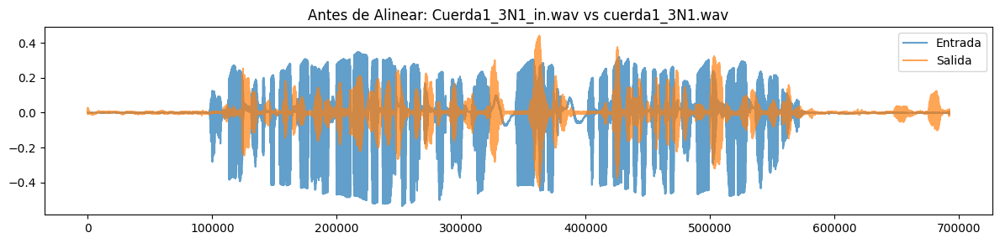

Cuerda1_3N1_in.wav vs cuerda1_3N1.wav: lag = 10660 muestras (241.72 ms)


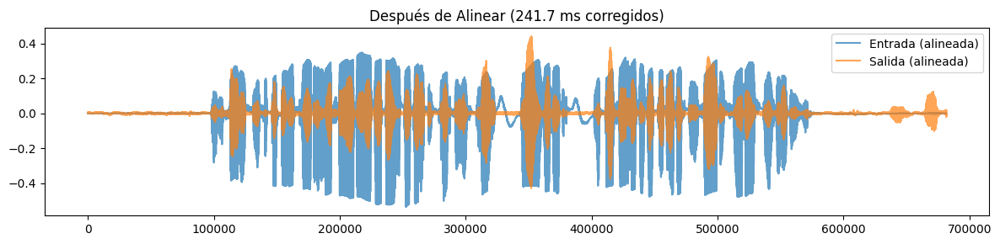

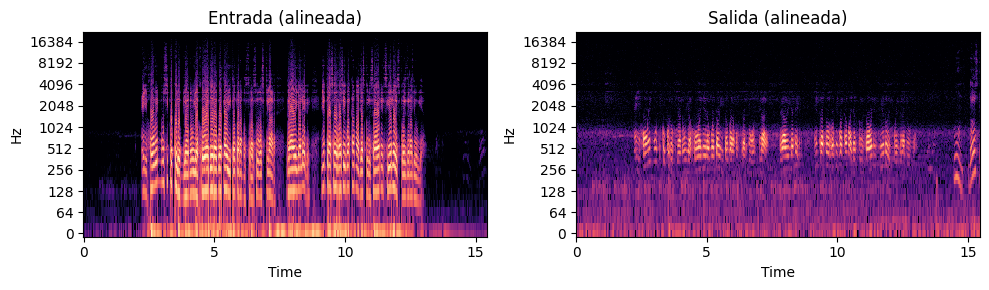

Archivos alineados guardados en:
  ./alineadas/Cuerda1_3N1_in_aligned.wav
  ./alineadas/cuerda1_3N1_aligned.wav



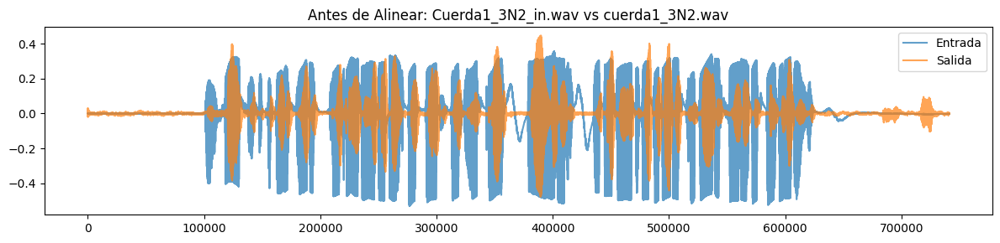

Cuerda1_3N2_in.wav vs cuerda1_3N2.wav: lag = 2183 muestras (49.50 ms)


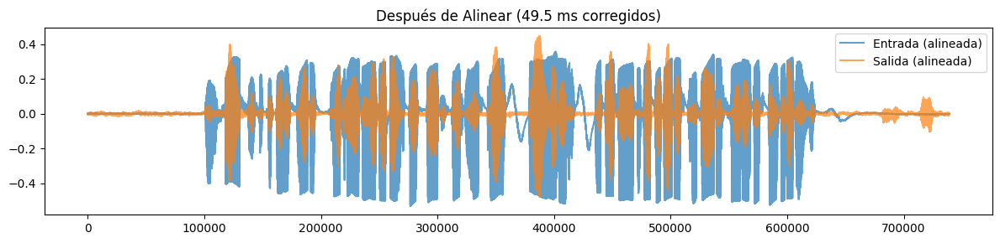

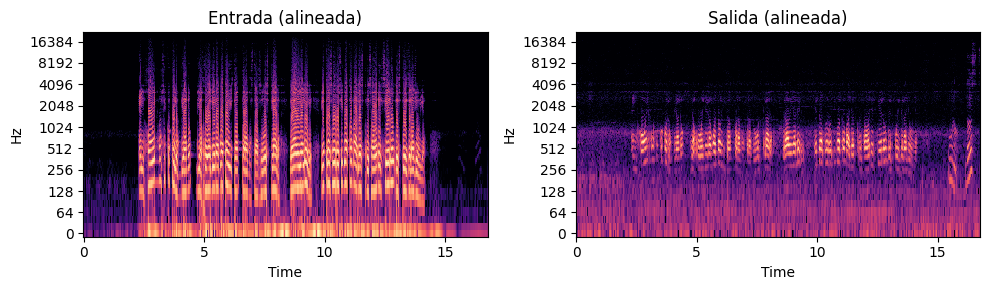

Archivos alineados guardados en:
  ./alineadas/Cuerda1_3N2_in_aligned.wav
  ./alineadas/cuerda1_3N2_aligned.wav



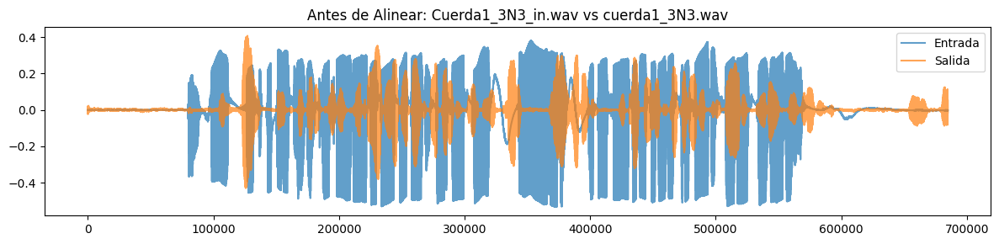

Cuerda1_3N3_in.wav vs cuerda1_3N3.wav: lag = 24744 muestras (561.09 ms)


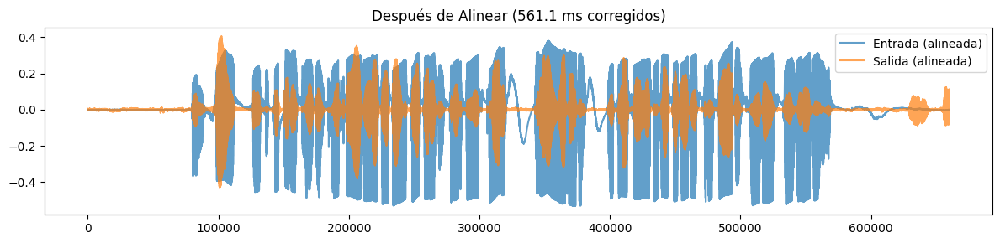

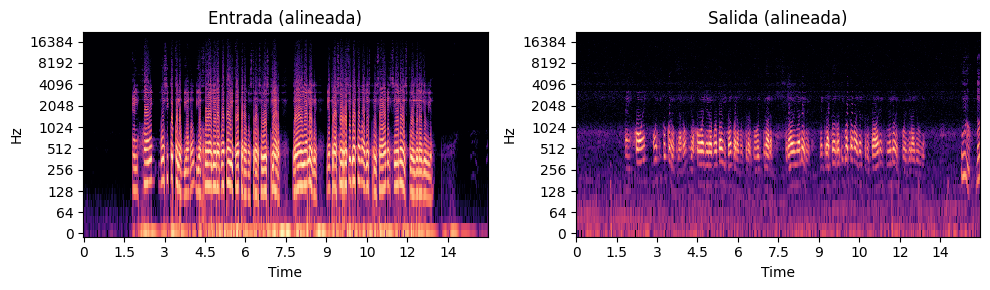

Archivos alineados guardados en:
  ./alineadas/Cuerda1_3N3_in_aligned.wav
  ./alineadas/cuerda1_3N3_aligned.wav



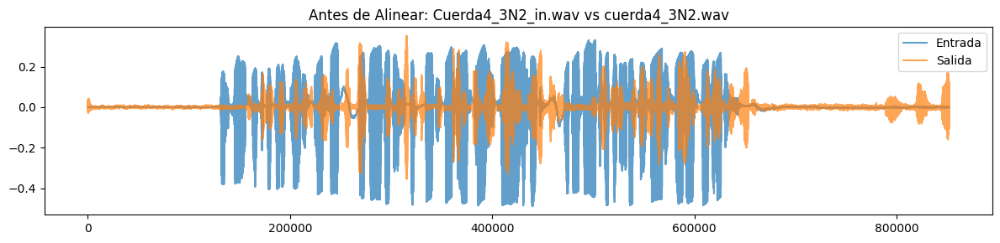

Cuerda4_3N2_in.wav vs cuerda4_3N2.wav: lag = 26754 muestras (606.67 ms)


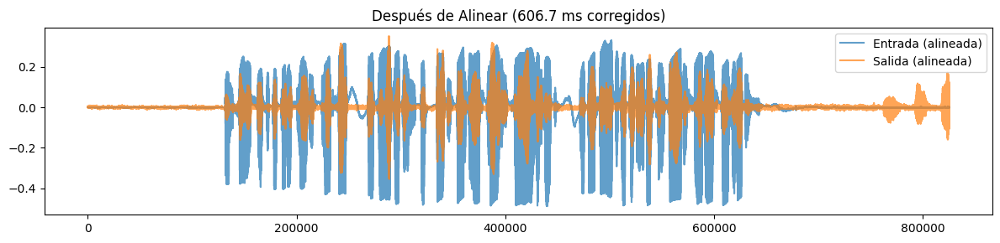

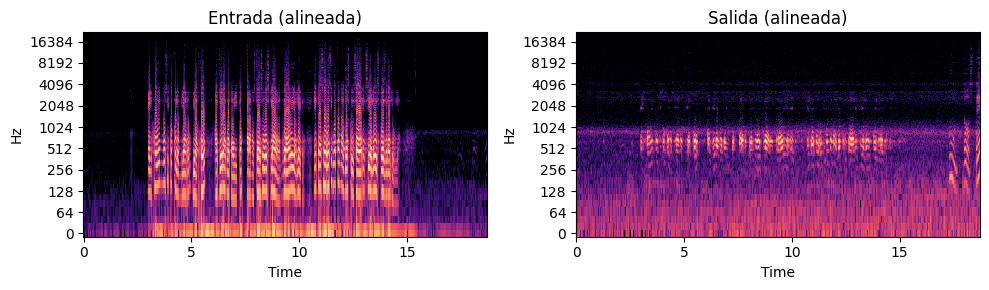

Archivos alineados guardados en:
  ./alineadas/Cuerda4_3N2_in_aligned.wav
  ./alineadas/cuerda4_3N2_aligned.wav



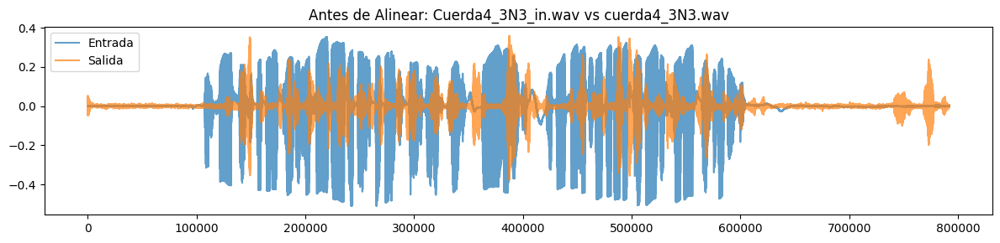

Cuerda4_3N3_in.wav vs cuerda4_3N3.wav: lag = 19183 muestras (434.99 ms)


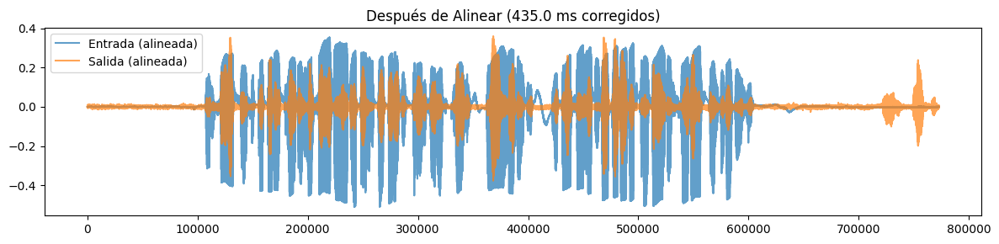

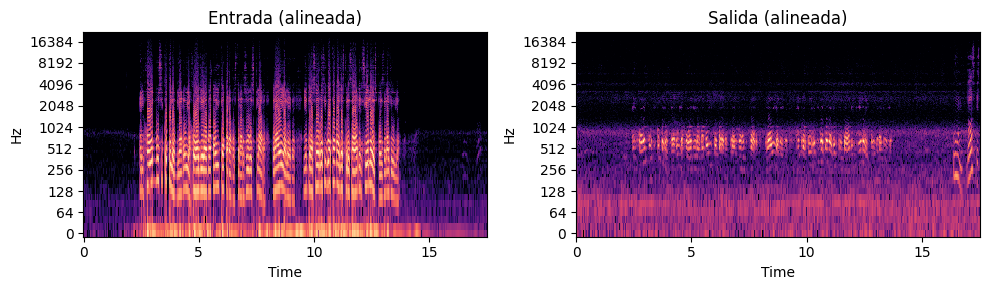

Archivos alineados guardados en:
  ./alineadas/Cuerda4_3N3_in_aligned.wav
  ./alineadas/cuerda4_3N3_aligned.wav



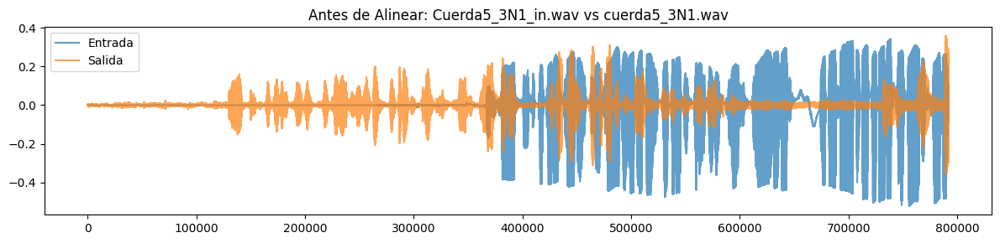

Cuerda5_3N1_in.wav vs cuerda5_3N1.wav: lag = -251228 muestras (-5696.78 ms)


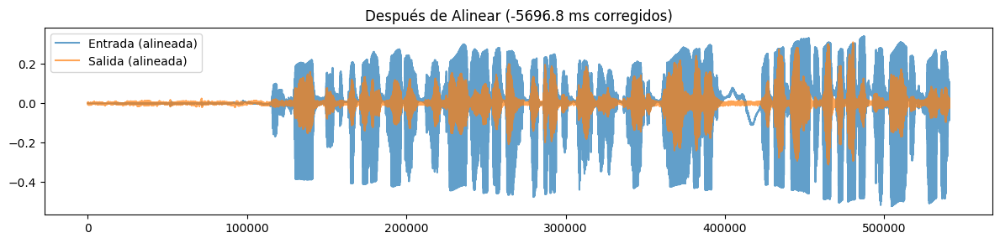

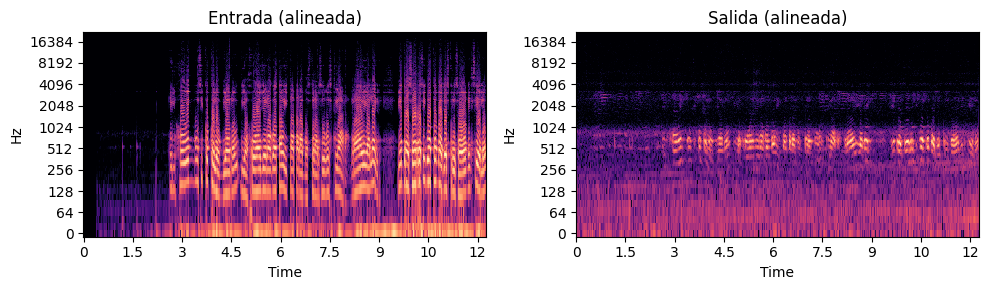

Archivos alineados guardados en:
  ./alineadas/Cuerda5_3N1_in_aligned.wav
  ./alineadas/cuerda5_3N1_aligned.wav



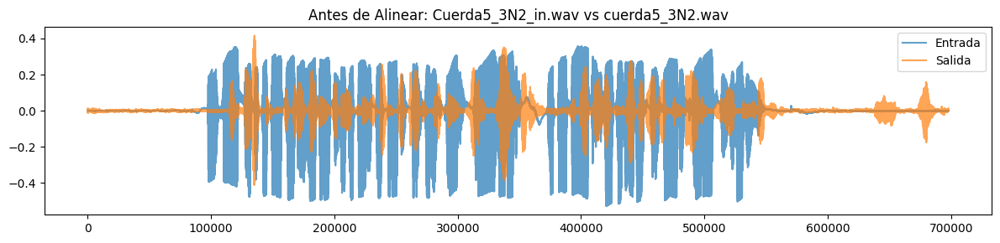

Cuerda5_3N2_in.wav vs cuerda5_3N2.wav: lag = 17452 muestras (395.74 ms)


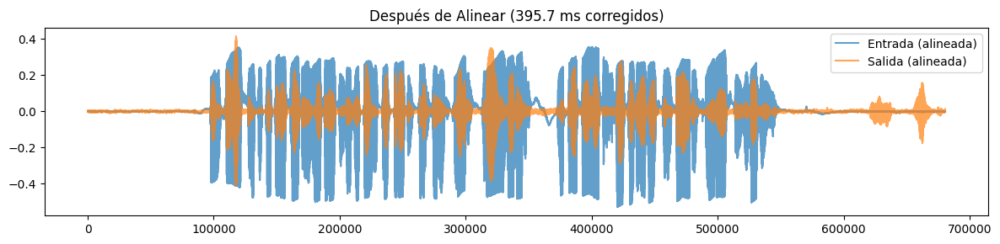

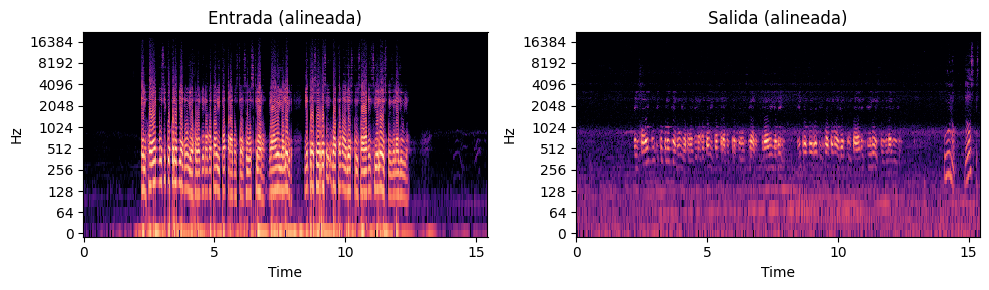

Archivos alineados guardados en:
  ./alineadas/Cuerda5_3N2_in_aligned.wav
  ./alineadas/cuerda5_3N2_aligned.wav



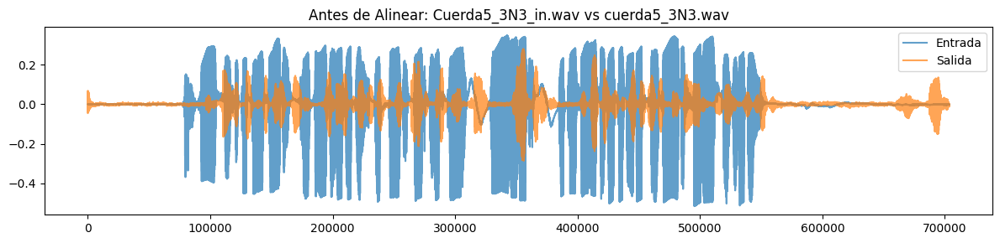

Cuerda5_3N3_in.wav vs cuerda5_3N3.wav: lag = 17430 muestras (395.24 ms)


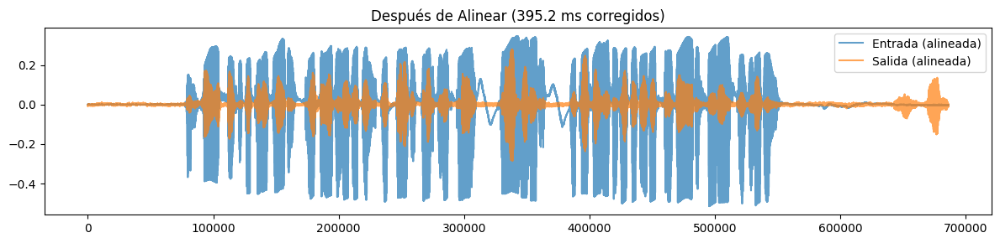

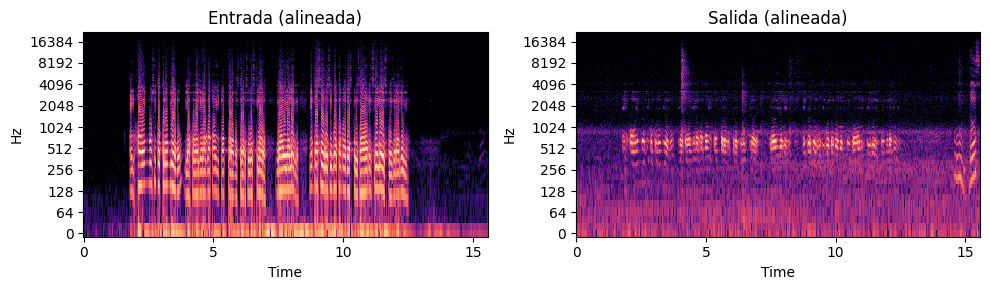

Archivos alineados guardados en:
  ./alineadas/Cuerda5_3N3_in_aligned.wav
  ./alineadas/cuerda5_3N3_aligned.wav



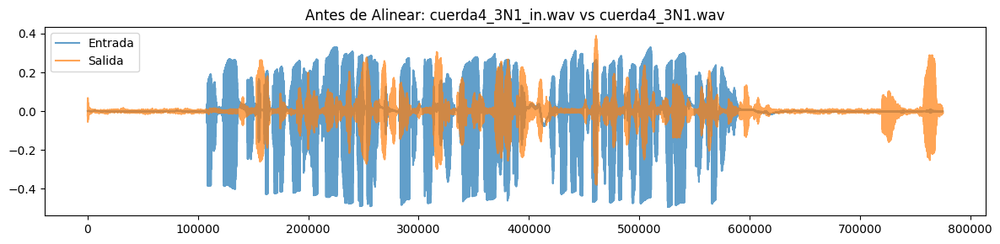

cuerda4_3N1_in.wav vs cuerda4_3N1.wav: lag = 29625 muestras (671.77 ms)


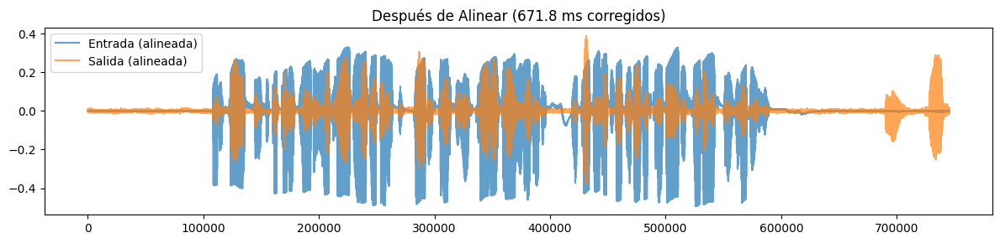

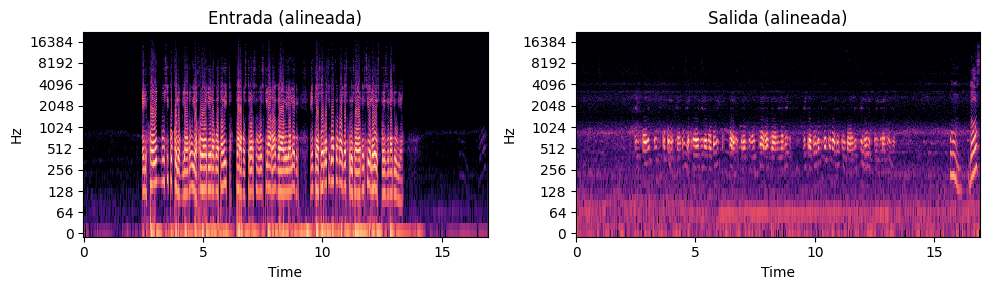

Archivos alineados guardados en:
  ./alineadas/cuerda4_3N1_in_aligned.wav
  ./alineadas/cuerda4_3N1_aligned.wav

✅ Proceso de alineación completado. Todos los pares fueron guardados en: ./alineadas


In [10]:
import os
import numpy as np
import librosa
import librosa.display
import soundfile as sf
import matplotlib.pyplot as plt
from scipy.signal import correlate

# ============================================================
# 5. ALINEACIÓN AUTOMÁTICA POR CORRELACIÓN CRUZADA
# ============================================================

def alinear_por_correlacion(y_in, y_out, sr):
    """
    Calcula el desfase entre dos señales y devuelve las señales alineadas.
    """
    corr = correlate(y_out, y_in, mode='full')
    lag = np.argmax(corr) - (len(y_in) - 1)
    delay_s = lag / sr

    # Ajustar las señales según el lag
    if lag > 0:
        y_out_al = y_out[lag:]
        y_in_al = y_in[:len(y_out_al)]
    elif lag < 0:
        y_in_al = y_in[-lag:]
        y_out_al = y_out[:len(y_in_al)]
    else:
        y_in_al, y_out_al = y_in, y_out

    return y_in_al, y_out_al, lag, delay_s

# ============================================================
# 6. VISUALIZAR Y GUARDAR EFECTO DE SINCRONIZACIÓN
# ============================================================

# Crea un subdirectorio para guardar los archivos alineados
dir_alineadas = os.path.join(directorio, "alineadas")
os.makedirs(dir_alineadas, exist_ok=True)

for entrada, salida in pares:
    path_in = os.path.join(directorio, entrada)
    path_out = os.path.join(directorio, salida)
    
    # Cargar señales
    y_in, sr_in = librosa.load(path_in, sr=None)
    y_out, sr_out = librosa.load(path_out, sr=None)
    assert sr_in == sr_out, "Las frecuencias de muestreo no coinciden."
    sr = sr_in

    min_len = min(len(y_in), len(y_out))
    y_in, y_out = y_in[:min_len], y_out[:min_len]

    # --- Antes de la alineación ---
    plt.figure(figsize=(12,3))
    plt.title(f"Antes de Alinear: {entrada} vs {salida}")
    plt.plot(y_in, label="Entrada", alpha=0.7)
    plt.plot(y_out, label="Salida", alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Aplicar alineación ---
    y_in_al, y_out_al, lag, delay_s = alinear_por_correlacion(y_in, y_out, sr)
    print(f"{entrada} vs {salida}: lag = {lag} muestras ({delay_s*1000:.2f} ms)")

    # --- Después de la alineación ---
    plt.figure(figsize=(12,3))
    plt.title(f"Después de Alinear ({delay_s*1000:.1f} ms corregidos)")
    plt.plot(y_in_al, label="Entrada (alineada)", alpha=0.7)
    plt.plot(y_out_al, label="Salida (alineada)", alpha=0.7)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # --- Espectrogramas sincronizados ---
    plt.figure(figsize=(10,3))
    D_in = librosa.amplitude_to_db(np.abs(librosa.stft(y_in_al)), ref=np.max)
    D_out = librosa.amplitude_to_db(np.abs(librosa.stft(y_out_al)), ref=np.max)
    plt.subplot(1,2,1)
    librosa.display.specshow(D_in, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.title("Entrada (alineada)")
    plt.subplot(1,2,2)
    librosa.display.specshow(D_out, sr=sr, x_axis='time', y_axis='log', cmap='magma')
    plt.title("Salida (alineada)")
    plt.tight_layout()
    plt.show()

    # --- Guardar resultados alineados ---
    nombre_base_in = os.path.splitext(entrada)[0] + "_aligned.wav"
    nombre_base_out = os.path.splitext(salida)[0] + "_aligned.wav"

    path_in_al = os.path.join(dir_alineadas, nombre_base_in)
    path_out_al = os.path.join(dir_alineadas, nombre_base_out)

    sf.write(path_in_al, y_in_al, sr)
    sf.write(path_out_al, y_out_al, sr)

    print(f"Archivos alineados guardados en:\n  {path_in_al}\n  {path_out_al}\n")

print("✅ Proceso de alineación completado. Todos los pares fueron guardados en:", dir_alineadas)


In [14]:
import os
import numpy as np
import pandas as pd
import librosa
import soundfile as sf
from scipy.signal import coherence

# ============================================================
# CONFIGURACIÓN
# ============================================================

directorio = "./alineadas"

# ============================================================
# FUNCIONES AUXILIARES
# ============================================================

def calcular_rms(y):
    """Calcula el valor RMS de una señal."""
    return np.sqrt(np.mean(np.square(y)))

def calcular_snr(y_in, y_out):
    """Calcula la relación señal a ruido (SNR) en dB."""
    ruido = y_in - y_out
    return 10 * np.log10(np.sum(y_in**2) / np.sum(ruido**2))

def calcular_coherencia_media(y_in, y_out, sr):
    """Calcula la coherencia promedio entre dos señales."""
    f, Cxy = coherence(y_in, y_out, fs=sr, nperseg=1024)
    return np.mean(Cxy)

def extraer_identificadores(nombre):
    """
    Extrae el nombre de cuerda y número de prueba.
    Ejemplo: 'Cuerda4_3N2_in_aligned.wav' → ('Cuerda4', '3N2')
    """
    base = os.path.basename(nombre)
    partes = base.split('_')
    cuerda = partes[0]
    prueba = partes[1] if len(partes) > 1 else "?"
    return cuerda, prueba

# ============================================================
# PROCESAMIENTO
# ============================================================

resultados = []

# Buscar todos los archivos *_in_aligned.wav
archivos_in = sorted([f for f in os.listdir(directorio) if "_in_aligned.wav" in f])

for archivo_in in archivos_in:
    # Archivo de salida correspondiente (sin el "_in_")
    archivo_out = archivo_in.replace("_in_aligned.wav", "_aligned.wav").replace("_in_", "_")

    path_in = os.path.join(directorio, archivo_in)
    path_out = os.path.join(directorio, archivo_out)

    if not os.path.exists(path_out):
        print(f"⚠️ No se encontró el archivo de salida correspondiente para {archivo_in}")
        continue

    # Cargar señales
    y_in, sr_in = librosa.load(path_in, sr=None)
    y_out, sr_out = librosa.load(path_out, sr=None)
    assert sr_in == sr_out, f"Frecuencias de muestreo distintas: {archivo_in} / {archivo_out}"
    sr = sr_in

    # Igualar longitudes
    min_len = min(len(y_in), len(y_out))
    y_in, y_out = y_in[:min_len], y_out[:min_len]

    # --- Cálculo de métricas ---
    rms_in = calcular_rms(y_in)
    rms_out = calcular_rms(y_out)
    rms_ratio = rms_out / rms_in
    snr = calcular_snr(y_in, y_out)
    coh = calcular_coherencia_media(y_in, y_out, sr)

    cuerda, prueba = extraer_identificadores(archivo_in)

    resultados.append({
        "Cuerda": cuerda,
        "Prueba": prueba,
        "RMS_in": rms_in,
        "RMS_out": rms_out,
        "RMS_ratio": rms_ratio,
        "SNR_dB": snr,
        "Coherencia_prom": coh
    })

# ============================================================
# GUARDAR RESULTADOS DETALLADOS
# ============================================================

df = pd.DataFrame(resultados)
df.sort_values(["Cuerda", "Prueba"], inplace=True)
path_csv = os.path.join(directorio, "analisis_metricas.csv")
df.to_csv(path_csv, index=False)
print(f"✅ Archivo con métricas guardado en:\n{path_csv}")

# ============================================================
# PROMEDIOS POR CUERDA
# ============================================================

df_resumen = df.groupby("Cuerda").agg({
    "RMS_in": "mean",
    "RMS_out": "mean",
    "RMS_ratio": ["mean", "std"],
    "SNR_dB": ["mean", "std"],
    "Coherencia_prom": ["mean", "std"]
}).reset_index()

# Aplanar nombres de columnas
df_resumen.columns = [
    "Cuerda",
    "RMS_in_prom", "RMS_out_prom",
    "RMS_ratio_prom", "RMS_ratio_std",
    "SNR_prom_dB", "SNR_std_dB",
    "Coherencia_prom", "Coherencia_std"
]

# Clasificación según calidad de transmisión
def clasificar(snr, coh):
    if snr > 25 and coh > 0.9:
        return "Excelente"
    elif snr > 20 and coh > 0.85:
        return "Buena"
    else:
        return "Deficiente"

df_resumen["Clasificacion"] = df_resumen.apply(
    lambda r: clasificar(r["SNR_prom_dB"], r["Coherencia_prom"]),
    axis=1
)

path_csv2 = os.path.join(directorio, "resumen_cuerdas.csv")
df_resumen.to_csv(path_csv2, index=False)
print(f"✅ Archivo resumen guardado en:\n{path_csv2}")


✅ Archivo con métricas guardado en:
./alineadas/analisis_metricas.csv
✅ Archivo resumen guardado en:
./alineadas/resumen_cuerdas.csv



# Análisis de Métricas de Señales Alineadas

Este documento describe las métricas calculadas en el análisis de señales acústicas alineadas (entrada `in` y salida `out`), así como la interpretación física esperada de cada una.

---

## 1. Valor RMS (Root Mean Square)

El valor cuadrático medio (RMS) mide la **energía promedio** de una señal, y se define como:

$$
\text{RMS}(y) = \sqrt{\frac{1}{N} \sum_{i=1}^{N} y_i^2}
$$

- **Interpretación:** mide la amplitud efectiva de la señal.
- **En el contexto del experimento:**  
  - Un RMS alto indica mayor potencia acústica o vibracional.  
  - Si $\text{RMS}_{out} < \text{RMS}_{in}$, significa que la señal se ha **atenuado** al pasar por el sistema (por ejemplo, a través de una cuerda).

---

## 2. Relación RMS (RMS Ratio)

Se define como:

$$
\text{RMS Ratio} = \frac{\text{RMS}_{out}}{\text{RMS}_{in}}
$$

- **Interpretación:** mide la fracción de energía transmitida.  
- **Valores esperados:**
  - $\text{RMS Ratio} \approx 1$: transmisión casi perfecta.
  - $\text{RMS Ratio} < 1$: hay pérdidas (amortiguamiento o absorción).
  - $\text{RMS Ratio} > 1$: amplificación (inusual en sistemas pasivos).

---

## 3. Relación Señal a Ruido (SNR)

La **SNR (Signal-to-Noise Ratio)** cuantifica cuánto más fuerte es la señal transmitida respecto al ruido de diferencia entre entrada y salida:

$$
\text{SNR} = 10 \log_{10} \left( \frac{\sum y_{in}^2}{\sum (y_{in} - y_{out})^2} \right)
$$

- **Interpretación:** mide la fidelidad de la transmisión.  
- **Valores esperados:**
  - $\text{SNR} > 25\,\text{dB}$ → Excelente coincidencia entre entrada y salida.  
  - $20 < \text{SNR} < 25\,\text{dB}$ → Buena coincidencia.  
  - $\text{SNR} < 20\,\text{dB}$ → Transmisión deficiente o con ruido.

---

## 4. Coherencia Media

La **coherencia** cuantifica la correlación espectral entre las señales de entrada y salida. Se define como:

$$
C_{xy}(f) = \frac{|P_{xy}(f)|^2}{P_{xx}(f) \, P_{yy}(f)}
$$

donde $P_{xy}(f)$ es la densidad espectral cruzada y $P_{xx}(f)$, $P_{yy}(f)$ son las densidades de potencia de cada señal.

En el código se promedia sobre todas las frecuencias:

$$
\overline{C_{xy}} = \frac{1}{N_f} \sum_{f} C_{xy}(f)
$$

- **Interpretación:** mide la similitud espectral (frecuencial) entre las señales.  
- **Valores esperados:**
  - $\overline{C_{xy}} > 0.9$: alta coherencia → comportamiento lineal estable.  
  - $0.85 < \overline{C_{xy}} < 0.9$: buena coherencia.  
  - $\overline{C_{xy}} < 0.85$: ruido o distorsión significativa.

---

## 5. Clasificación Global de Calidad

Basado en las métricas $\text{SNR}$ y $\overline{C_{xy}}$, se asigna una etiqueta cualitativa:

| Clasificación | Condición | Interpretación Física |
|----------------|------------|-----------------------|
| **Excelente** | $\text{SNR} > 25$ dB y $\overline{C_{xy}} > 0.9$ | Transmisión casi perfecta. |
| **Buena** | $\text{SNR} > 20$ dB y $\overline{C_{xy}} > 0.85$ | Atenuación leve, buena correspondencia. |
| **Deficiente** | Caso contrario | Ruido, pérdidas o desalineación espectral. |

---

## 6. Expectativas Generales

- En sistemas de cuerdas tensadas, se espera que la **SNR** y la **coherencia** disminuyan con el número de nodo ($N$), debido a mayor dispersión y amortiguamiento.  
- Las **cuerdas más tensas** deberían mostrar una **mayor RMS Ratio** y **mayor coherencia**, al transmitir mejor la energía acústica.

In [15]:
import pandas as pd

# Cargar el archivo resumen
df = pd.read_csv("./alineadas/resumen_cuerdas.csv")

# Crear un puntaje combinado (puedes ajustar pesos)
df["Puntaje"] = 0.6 * df["SNR_prom_dB"] + 0.4 * (df["Coherencia_prom"] * 100)

# Ordenar de mejor a peor
df_top = df.sort_values(by="Puntaje", ascending=False).reset_index(drop=True)

# Mostrar el top
print("=== TOP CUERDAS POR CALIDAD DE TRANSMISIÓN ===")
print(df_top[["Cuerda", "SNR_prom_dB", "Coherencia_prom", "Clasificacion", "Puntaje"]])

# Guardar resultado
df_top.to_csv("./alineadas/top_cuerdas.csv", index=False)
print("\n✅ Archivo guardado como ./alineadas/top_cuerdas.csv")


=== TOP CUERDAS POR CALIDAD DE TRANSMISIÓN ===
    Cuerda  SNR_prom_dB  Coherencia_prom Clasificacion   Puntaje
0  cuerda1     1.046162         0.020728    Deficiente  1.456813
1  cuerda4     0.788843         0.012735    Deficiente  0.982723
2  cuerda5     0.637172         0.014614    Deficiente  0.966864

✅ Archivo guardado como ./alineadas/top_cuerdas.csv
